## Subclustering of radial glia

In [1]:
library(Seurat)
library(ggplot2)
library(dplyr)
library(RColorBrewer)
library(gridExtra)
library(ggh4x)

Attaching SeuratObject

Attaching sp


Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union



Attaching package: ‘gridExtra’


The following object is masked from ‘package:dplyr’:

    combine




In [3]:
rg_pool <- readRDS(file = "/local/Nina/jupyterlab/brains_trans/rg_pool_in.rds")

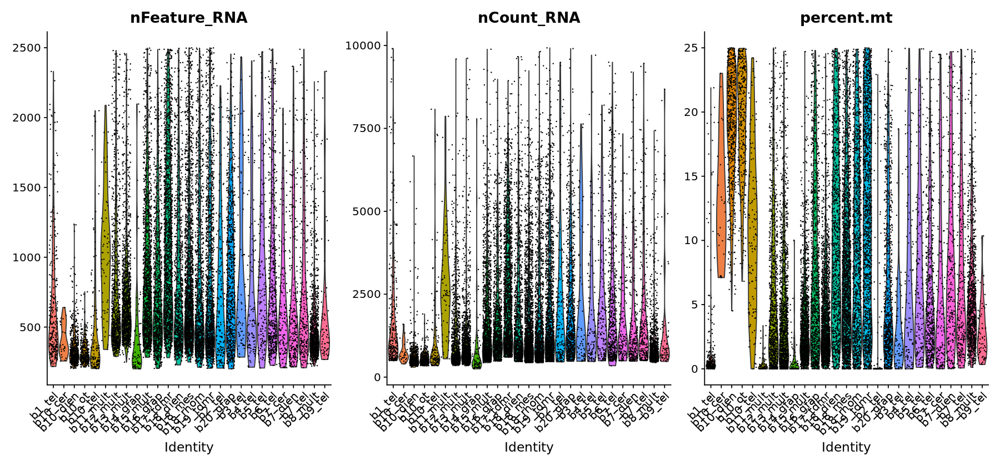

In [6]:
options(repr.plot.width=15, repr.plot.height=7)

qc_plot_rg <- VlnPlot(object = rg_pool, features = c("nFeature_RNA", "nCount_RNA", "percent.mt"), ncol = 3, pt.size = 0.05, group.by = "orig.ident")
qc_plot_rg

### Clustering with regression of technical covariates

In [8]:
rg_pool <- NormalizeData(object = rg_pool, normalization.method = "LogNormalize", scale.factor = 1e4)

When using repel, set xnudge and ynudge to 0 for optimal results

Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Removed 1575 rows containing missing values (geom_point).”
Warning message:
“ggrepel: 10 unlabeled data points (too many overlaps). Consider increasing max.overlaps”


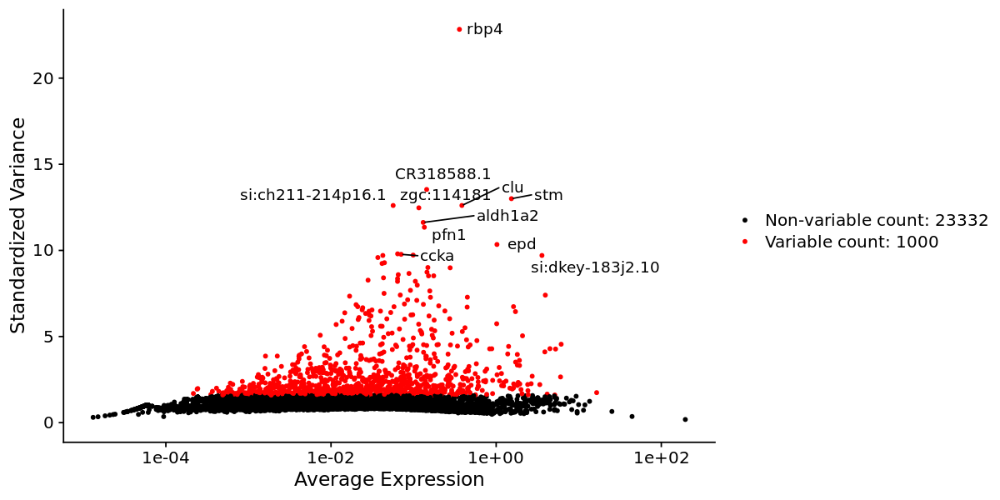

In [9]:
options(repr.plot.width=10, repr.plot.height=5)

rg_pool <- FindVariableFeatures(object = rg_pool, selection.method = 'vst', nfeatures = 1000)

#plot variable features with top vargenes labeled
top20 <- head(x = VariableFeatures(object = rg_pool), 20)
plot_var_feat <- LabelPoints(plot = VariableFeaturePlot(object = rg_pool), points = top20, repel = TRUE)
plot_var_feat

In [10]:
all.genes <- rownames(x = rg_pool)
rg_pool <- ScaleData(object = rg_pool, features = all.genes, vars.to.regress = c("nFeature_RNA","nCount_RNA","percent.mt"))

Regressing out nFeature_RNA, nCount_RNA, percent.mt

Centering and scaling data matrix



PC_ 1 
Positive:  mki67, top2a, nusap1, zgc:110425, si:dkey-108k21.10, hmgn2, zgc:165555.15, cenpf, cdk1, tpx2 
	   si:ch211-113a14.18, tuba8l, ccna2, ube2c, stmn1a, hmgb2a, zgc:165555.9, CABZ01058261.1, cks2, mad2l1 
	   zgc:110216, si:dkey-261m9.12, dlgap5, kifc1, si:ch211-288g17.3, aurkb, lbr, aspm, zgc:165555.19, si:ch211-222l21.1 
Negative:  slc6a1b, ptgdsb.1, id1, mt2, slc6a11b, slc6a9, lgals2a, cebpd, bag3, rpz5 
	   gpd1b, proca1, her4.1, timp4.3, cited4b, jdp2b, FO704813.1, cd81b, si:ch211-153f2.7, her6 
	   rhbg, cyp26b1, kctd12.2, zgc:153704, her4.2, stm, RFP, si:dkey-4p15.3, si:dkey-238o13.4, fosb 
PC_ 2 
Positive:  slc6a1b, lgals2a, slc6a11b, stm, mt2, FO704813.1, si:dkey-238o13.4, gpd1b, ca6, cd81b 
	   EGFP, apof, si:ch211-237l4.6, RFP, robo4, slc6a9, mbpa, crabp1a, cyp26b1, slc7a10a 
	   zgc:109949, lgals1l1, epd, mgst1.2, CT027638.1, rhbg, itih1, zgc:158463, dcn, nppc 
Negative:  junba, btg2, jdp2b, fosb, fosl1a, mycb, sdc4, junbb, f3b, hsp70l 
	   mcl1a, si:ch73-335l2

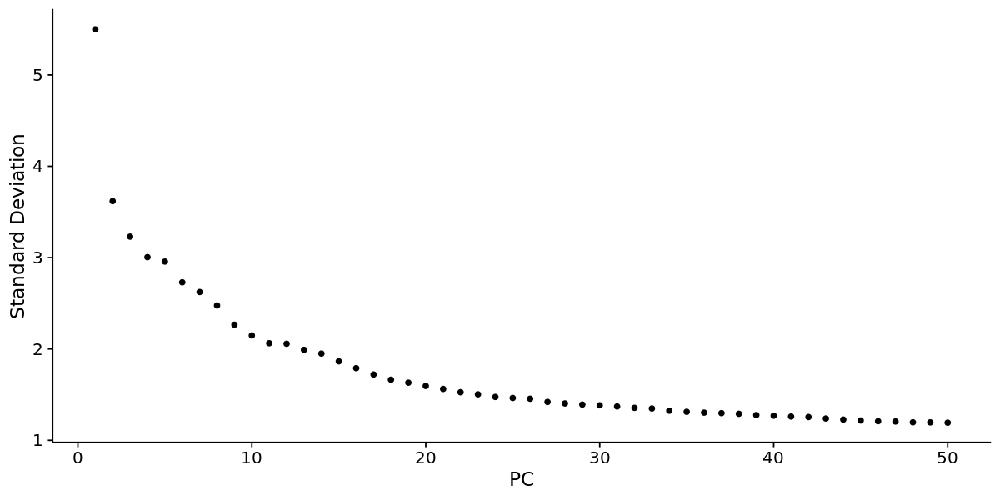

In [11]:
rg_pool <- RunPCA(object = rg_pool)

ElbowPlot(object = rg_pool, ndims = 50)

In [37]:
rg_pool <- FindNeighbors(rg_pool, dims = 1:20, verbose = FALSE)
rg_pool <- FindClusters(rg_pool, resolution = 0.6, verbose = FALSE)

rg_pool <- RunUMAP(rg_pool, dims = 1:20, verbose = FALSE)


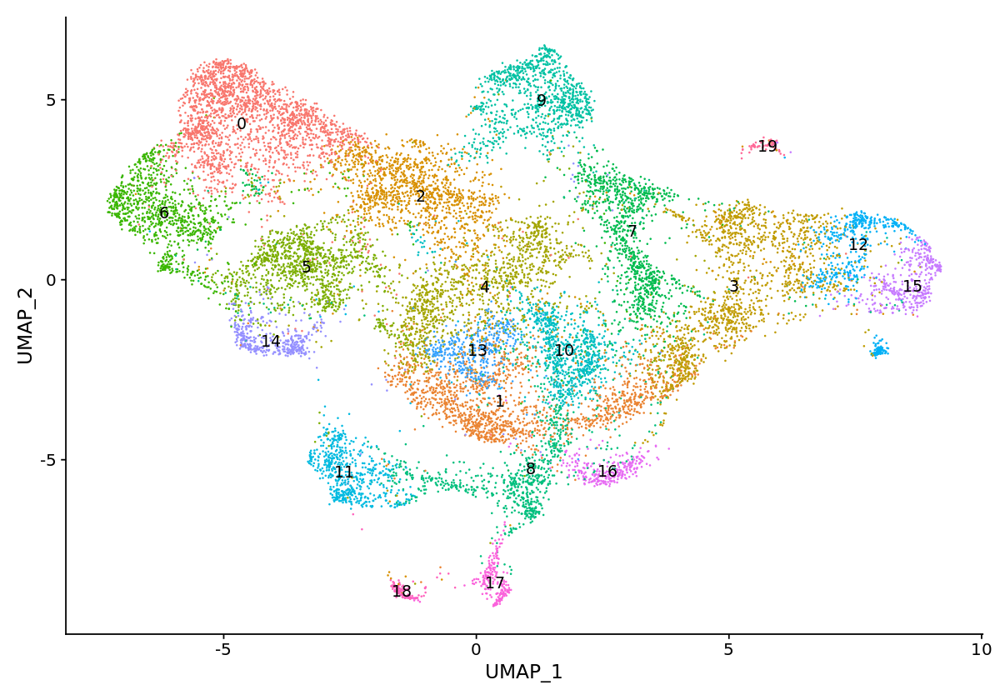

In [38]:
options(repr.plot.width=10, repr.plot.height=7)

DimPlot(rg_pool, label = TRUE) + NoLegend()

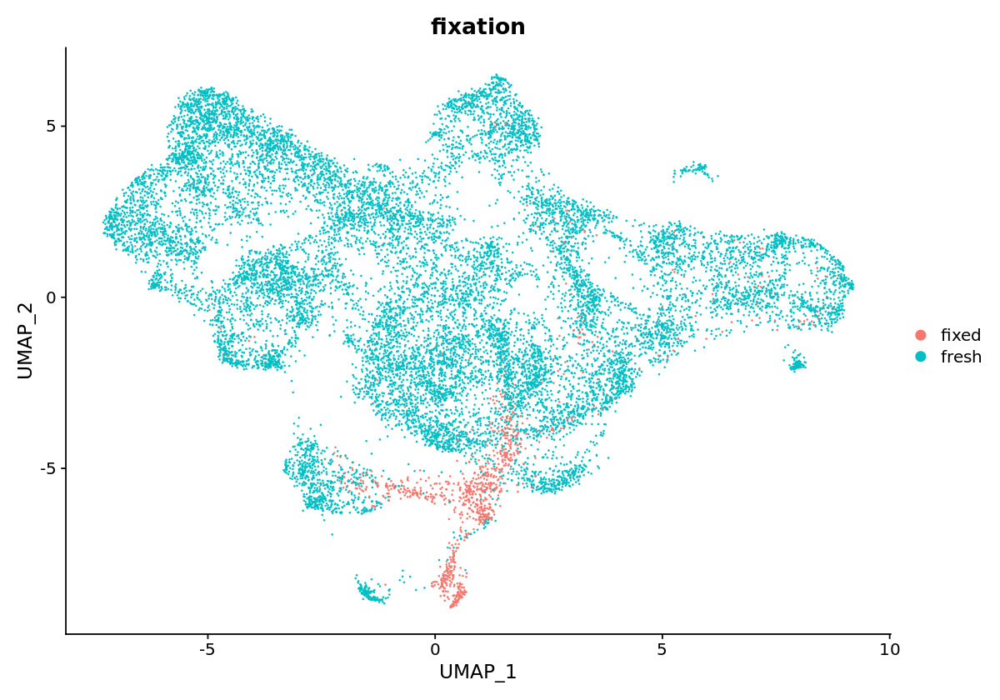

In [39]:
options(repr.plot.width=10, repr.plot.height=7)

DimPlot(rg_pool, group.by = "fixation")

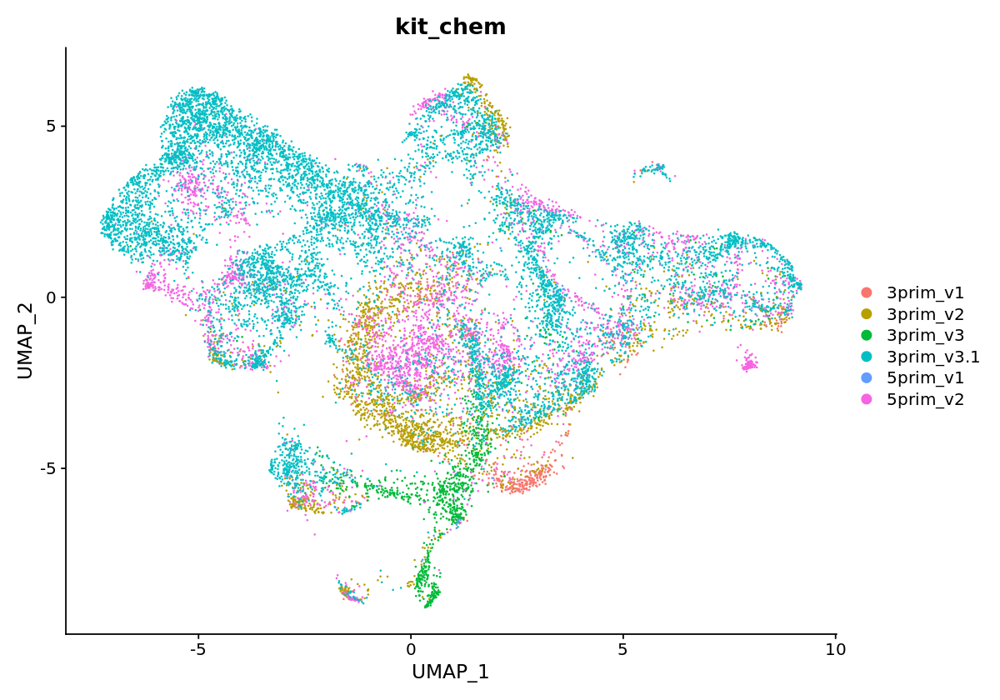

In [40]:
options(repr.plot.width=10, repr.plot.height=7)

DimPlot(rg_pool, group.by = "kit_chem")

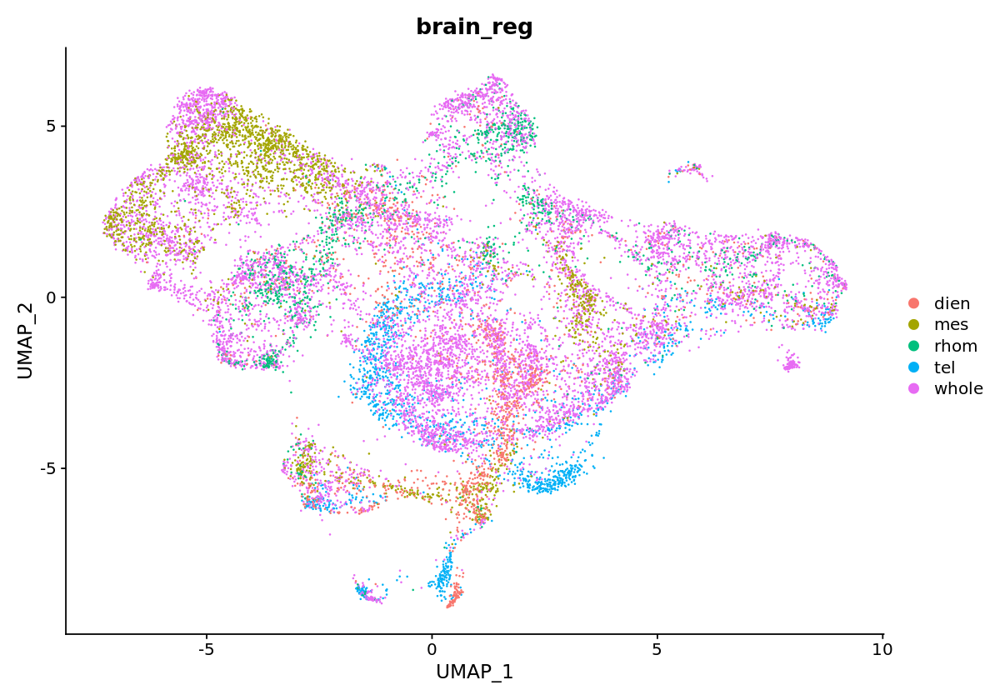

In [41]:
options(repr.plot.width=10, repr.plot.height=7)

DimPlot(rg_pool, group.by = "brain_reg")

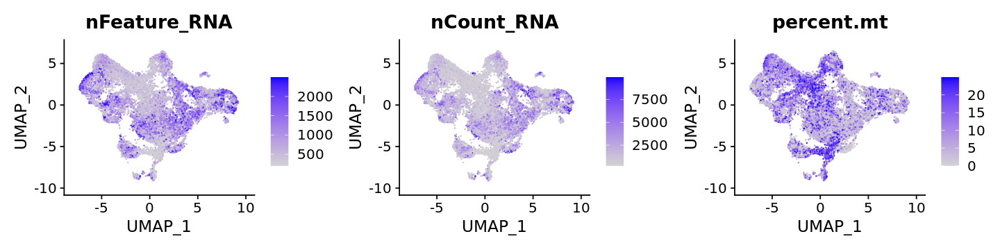

In [42]:
options(repr.plot.width=12, repr.plot.height=3)

FeaturePlot(rg_pool, features = c("nFeature_RNA","nCount_RNA","percent.mt"), ncol = 3, raster = FALSE)

### Clustering with regression of all covariates (including orig.ident)

In [25]:
rg_pool_2 <- readRDS(file = "/local/Nina/jupyterlab/brains_trans/rg_pool_in.rds")

In [26]:
rg_pool_2 <- NormalizeData(object = rg_pool_2, normalization.method = "LogNormalize", scale.factor = 1e4)

When using repel, set xnudge and ynudge to 0 for optimal results

Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Removed 1575 rows containing missing values (geom_point).”
Warning message:
“ggrepel: 10 unlabeled data points (too many overlaps). Consider increasing max.overlaps”


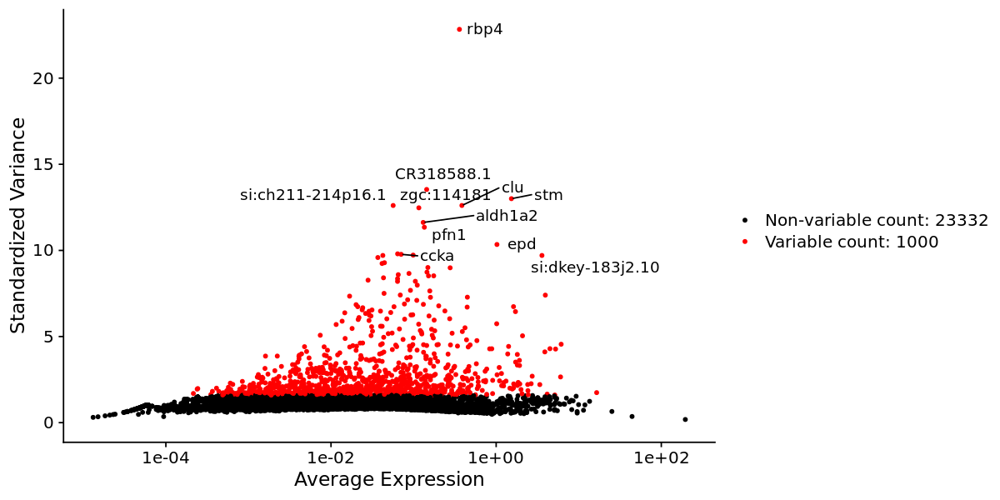

In [27]:
options(repr.plot.width=10, repr.plot.height=5)

rg_pool_2 <- FindVariableFeatures(object = rg_pool_2, selection.method = 'vst', nfeatures = 1000)

#plot variable features with top vargenes labeled
top20 <- head(x = VariableFeatures(object = rg_pool_2), 20)
plot_var_feat <- LabelPoints(plot = VariableFeaturePlot(object = rg_pool_2), points = top20, repel = TRUE)
plot_var_feat

In [ ]:
all.genes <- rownames(x = rg_pool_2)
rg_pool_2 <- ScaleData(object = rg_pool_2, features = all.genes, vars.to.regress = c("nFeature_RNA","nCount_RNA","percent.mt", "orig.ident"))

Regressing out nFeature_RNA, nCount_RNA, percent.mt, orig.ident



PC_ 1 
Positive:  mki67, top2a, nusap1, zgc:110425, si:dkey-108k21.10, hmgn2, zgc:165555.15, cenpf, cdk1, tpx2 
	   si:ch211-113a14.18, hmgb2a, tuba8l, ccna2, ube2c, stmn1a, CABZ01058261.1, zgc:165555.9, cks2, mad2l1 
	   zgc:110216, si:dkey-261m9.12, dlgap5, kifc1, aurkb, si:ch211-288g17.3, hmgb2b, si:ch211-222l21.1, zgc:165555.19, aspm 
Negative:  slc6a1b, ptgdsb.1, id1, slc6a11b, bag3, slc6a9, mt2, lgals2a, kctd12.2, proca1 
	   gpd1b, cebpd, RFP, cited4b, rpz5, timp4.3, FO704813.1, si:ch211-251b21.1, stm, her6 
	   jdp2b, cyp26b1, zgc:153704, her4.1, cd81b, fosb, si:ch211-153f2.7, her4.2, rhbg, si:dkey-4p15.3 
PC_ 2 
Positive:  slc6a1b, lgals2a, mt2, gpd1b, stm, slc6a11b, FO704813.1, ca6, cd81b, si:ch211-237l4.6 
	   si:dkey-238o13.4, lgals1l1, zgc:153704, mgst1.2, slc6a9, rbp1, zgc:109949, slc7a10a, itih1, robo4 
	   EGFP, apof, tmod4, cyp1b1, ptgdsb.1, susd5, si:busm1-57f23.1, RFP, si:ch211-119e14.1, zgc:123068 
Negative:  junba, btg2, hsp70l, egr1, her15.2, junbb, her15.1, her4.

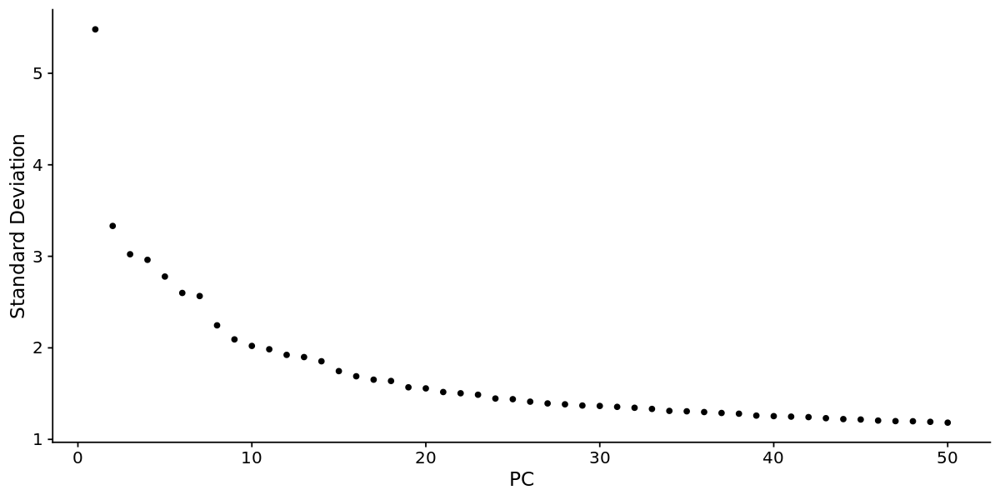

In [30]:
rg_pool_2 <- RunPCA(object = rg_pool_2)

ElbowPlot(object = rg_pool_2, ndims = 50)

In [29]:
str(rg_pool_2@commands)

List of 7
 $ RunPCA.RNA              :Formal class 'SeuratCommand' [package "SeuratObject"] with 5 slots
  .. ..@ name       : chr "RunPCA.RNA"
  .. ..@ time.stamp : POSIXct[1:1], format: "2022-04-28 12:50:50"
  .. ..@ assay.used : chr "RNA"
  .. ..@ call.string: chr "RunPCA(object = brain_pool)"
  .. ..@ params     :List of 10
  .. .. ..$ assay          : chr "RNA"
  .. .. ..$ npcs           : num 50
  .. .. ..$ rev.pca        : logi FALSE
  .. .. ..$ weight.by.var  : logi TRUE
  .. .. ..$ verbose        : logi TRUE
  .. .. ..$ ndims.print    : int [1:5] 1 2 3 4 5
  .. .. ..$ nfeatures.print: num 30
  .. .. ..$ reduction.name : chr "pca"
  .. .. ..$ reduction.key  : chr "PC_"
  .. .. ..$ seed.use       : num 42
 $ FindNeighbors.RNA.pca   :Formal class 'SeuratCommand' [package "SeuratObject"] with 5 slots
  .. ..@ name       : chr "FindNeighbors.RNA.pca"
  .. ..@ time.stamp : POSIXct[1:1], format: "2022-04-28 13:37:33"
  .. ..@ assay.used : chr "RNA"
  .. ..@ call.string: chr "FindNeig

In [31]:
rg_pool_2 <- FindNeighbors(rg_pool_2, dims = 1:20, verbose = FALSE)
rg_pool_2 <- FindClusters(rg_pool_2, resolution = 0.6, verbose = FALSE)

rg_pool_2 <- RunUMAP(rg_pool_2, dims = 1:20, verbose = FALSE)


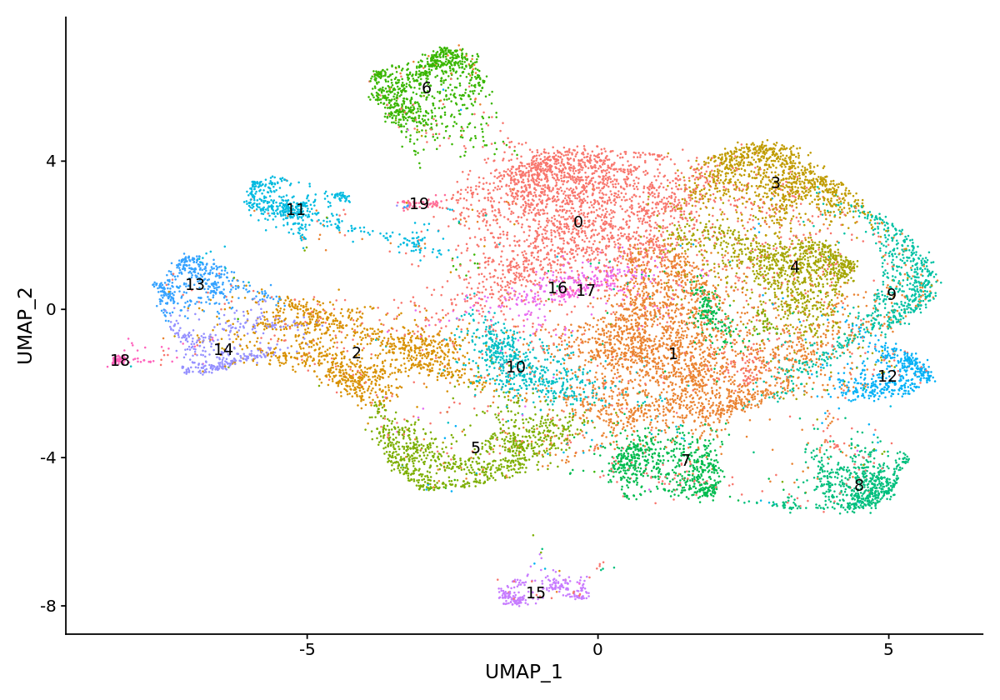

In [32]:
options(repr.plot.width=10, repr.plot.height=7)

DimPlot(rg_pool_2, label = TRUE) + NoLegend()

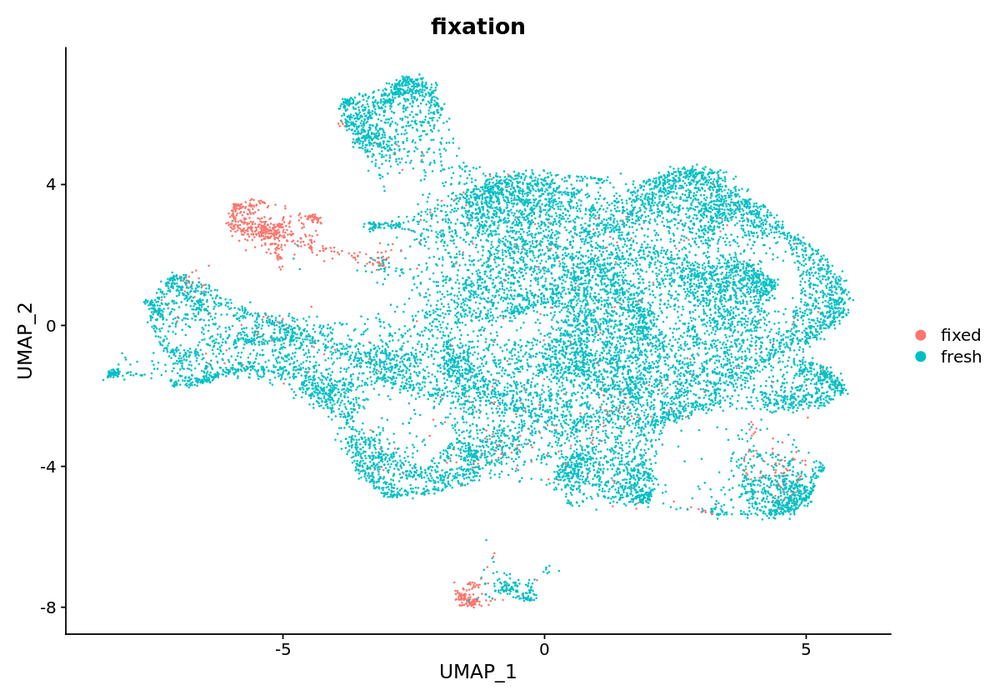

In [33]:
options(repr.plot.width=10, repr.plot.height=7)

DimPlot(rg_pool_2, group.by = "fixation")

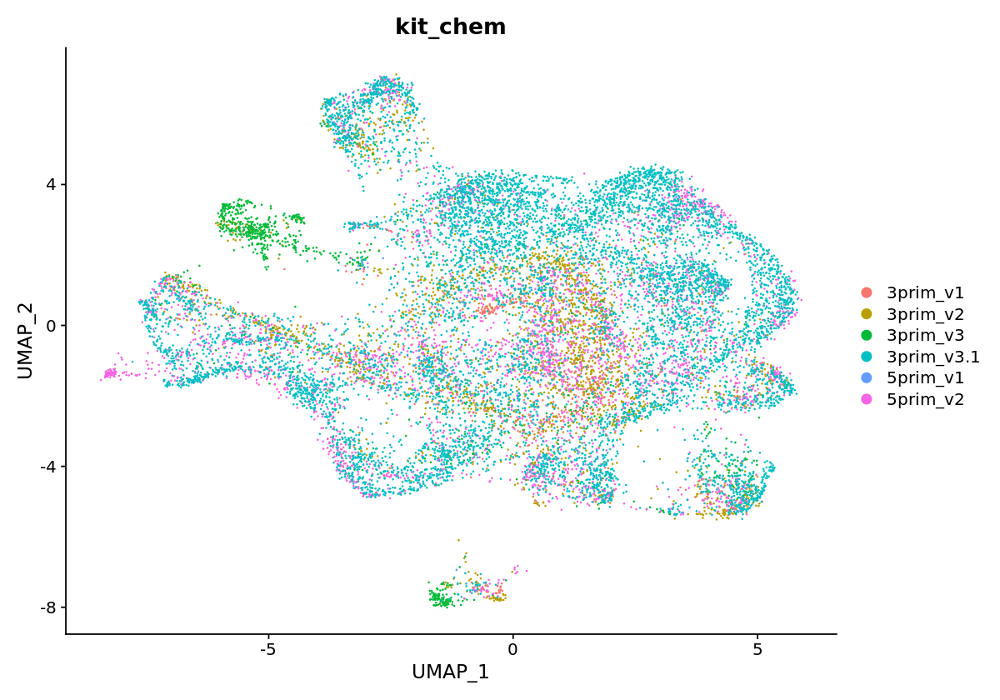

In [34]:
options(repr.plot.width=10, repr.plot.height=7)

DimPlot(rg_pool_2, group.by = "kit_chem")

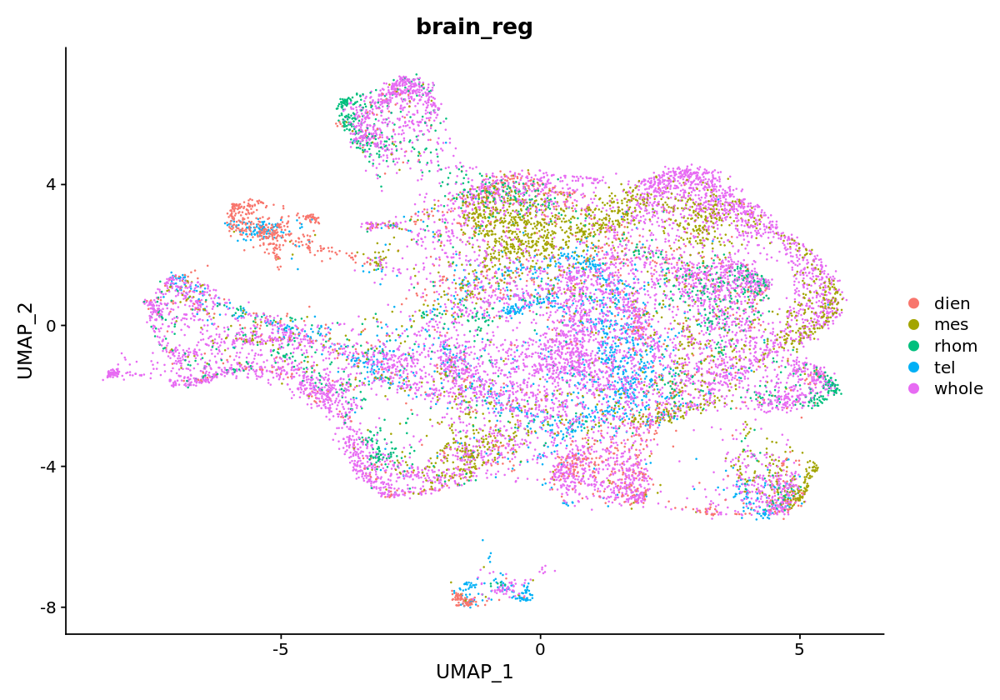

In [35]:
options(repr.plot.width=10, repr.plot.height=7)

DimPlot(rg_pool_2, group.by = "brain_reg")

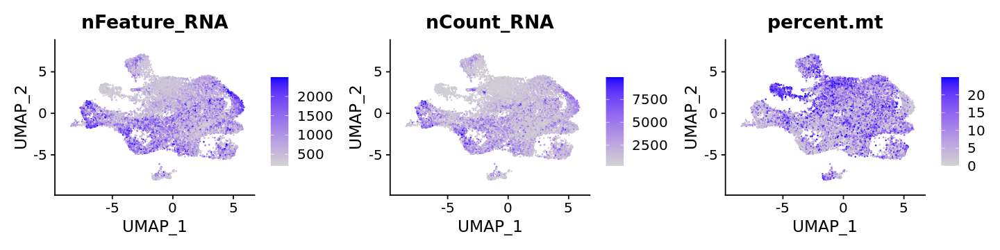

In [36]:
options(repr.plot.width=12, repr.plot.height=3)

FeaturePlot(rg_pool_2, features = c("nFeature_RNA","nCount_RNA","percent.mt"), ncol = 3, raster = FALSE)

In [ ]:
# save embedding with regression
saveRDS(rg_pool_2, file = "/local/Nina/jupyterlab/brains_trans/rg_pool_reg.rds")

### Identify cluster-specific markers
Use the embedding with regression of all covariates.

#### Recluster with higher resolution - final
While inspecting marker genes I saw that some clusters were not appropriately split so I will recluster the object with regressed counts, but with higher resolution.

In [ ]:
#rg_pool <- readRDS(file = "/local/Nina/jupyterlab/brains_trans/rg_pool_reg.rds")

In [54]:
rg_pool <- FindNeighbors(rg_pool, dims = 1:28, verbose = FALSE)
rg_pool <- FindClusters(rg_pool, resolution = 0.8, verbose = FALSE)

rg_pool <- RunUMAP(rg_pool, dims = 1:28, verbose = FALSE)

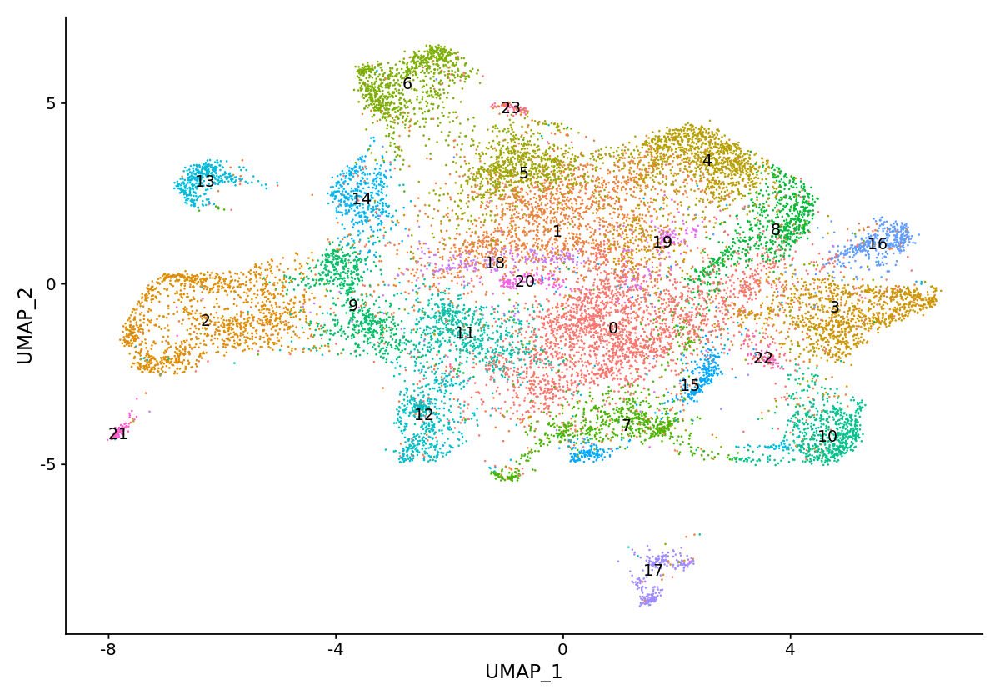

In [65]:
options(repr.plot.width=10, repr.plot.height=7)

DimPlot(rg_pool, label = TRUE) + NoLegend()

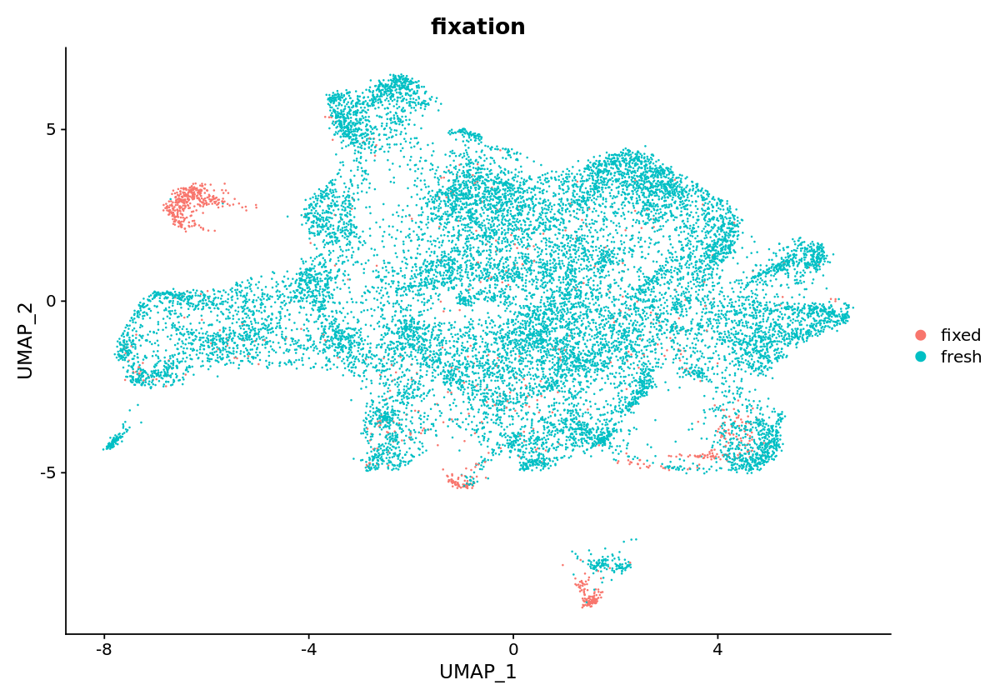

In [66]:
options(repr.plot.width=10, repr.plot.height=7)

DimPlot(rg_pool, group.by = "fixation")

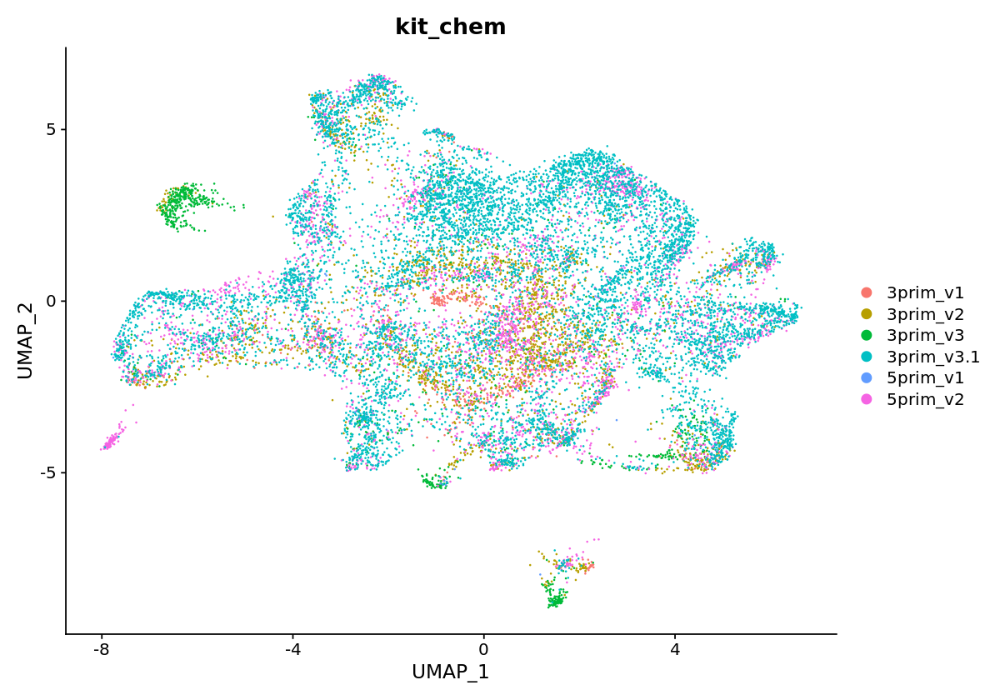

In [67]:
options(repr.plot.width=10, repr.plot.height=7)

DimPlot(rg_pool, group.by = "kit_chem")

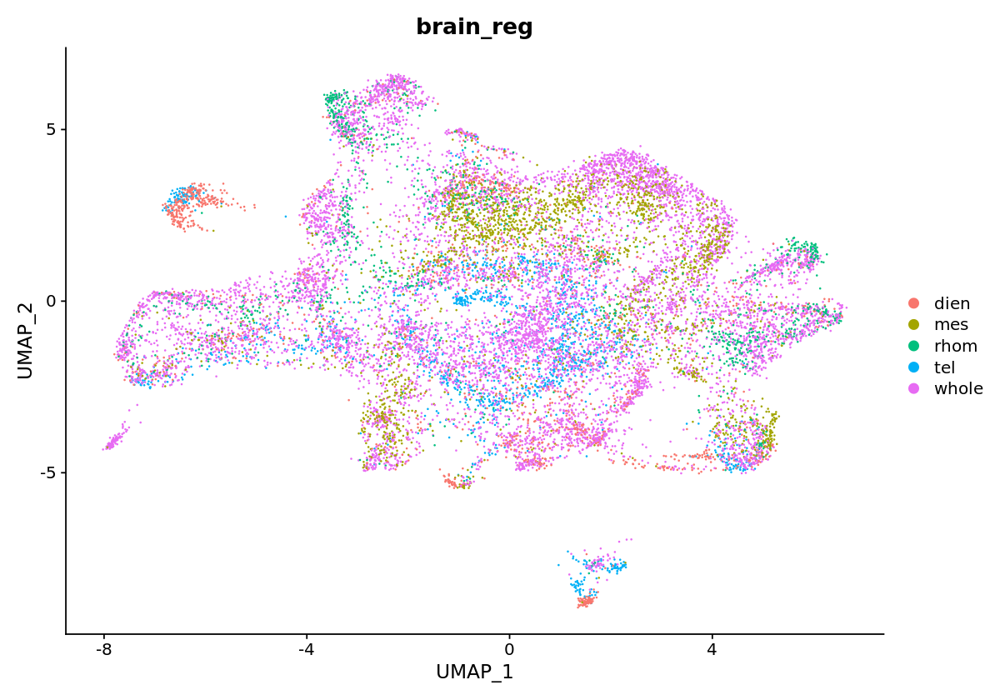

In [68]:
options(repr.plot.width=10, repr.plot.height=7)

DimPlot(rg_pool, group.by = "brain_reg")

In [70]:
# save original numeric names as separate 
rg_pool$pc28_res0.8_clusters_numeric <- Idents(rg_pool)

#### Find and select useful markers

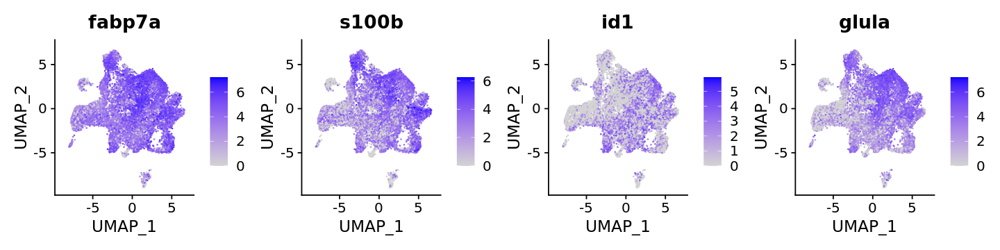

In [236]:
options(repr.plot.width=12, repr.plot.height=3)

#quick check of general radial glia markers
FeaturePlot(rg_pool, features = c("fabp7a", "s100b", "id1", "glula"), ncol = 4)

In [71]:
# find markers
rg_pool.mct.markers.bimod <- FindAllMarkers(object = rg_pool, only.pos = TRUE, min.pct = 0.2, logfc.threshold = 0.2, test.use = "bimod")
rg_pool.mct.markers.bimod %>% group_by(cluster) %>% top_n(n = 2, wt = avg_log2FC)
write.csv(rg_pool.mct.markers.bimod, file = "/local/Nina/jupyterlab/brains_trans/rg_pool_reg_28pcs_res0-8_markers_bimod.csv")

Calculating cluster 0

Calculating cluster 1

Calculating cluster 2

Calculating cluster 3

Calculating cluster 4

Calculating cluster 5

Calculating cluster 6

Calculating cluster 7

Calculating cluster 8

Calculating cluster 9

Calculating cluster 10

Calculating cluster 11

Calculating cluster 12

Calculating cluster 13

Calculating cluster 14

Calculating cluster 15

Calculating cluster 16

Calculating cluster 17

Calculating cluster 18

Calculating cluster 19

Calculating cluster 20

Calculating cluster 21

Calculating cluster 22

Calculating cluster 23



p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>
1.050677e-306,1.818856,0.599,0.318,2.556507e-302,0,si:ch211-251b21.1
8.483833e-181,1.830859,0.335,0.133,2.064286e-176,0,id2b
4.804927e-184,1.402484,0.439,0.244,1.169135e-179,1,snap25a
1.908253e-161,1.219197,0.343,0.243,4.643162e-157,1,ndrg4
0.000000e+00,3.737129,0.950,0.420,0.000000e+00,2,hmgn2
0.000000e+00,3.294106,0.877,0.338,0.000000e+00,2,hmgb2a
0.000000e+00,4.325150,0.587,0.094,0.000000e+00,3,stm
5.607445e-299,2.971357,0.311,0.018,1.364404e-294,3,slc7a10a
0.000000e+00,2.748670,0.735,0.161,0.000000e+00,4,si:dkey-238o13.4


In [6]:
#rg_pool.mct.markers.bimod <- read.csv(file = "/local/Nina/jupyterlab/brains_trans/rg_pool_reg_28pcs_res0-8_markers_bimod.csv")

Use FeaturePlots (below) to inspect all clusters, then record cluster-specific markers (unique ones if possible and those shared between subset of clusters). Based on this I will merge clusters that share a similar expression profile.

In [96]:
table(rg_pool@active.ident)


   0    1    2    3    4    5    6    7    8    9   10   11   12   13   14   15 
2648 2073 1248 1155 1024  984  880  745  666  659  637  630  500  415  407  386 
  16   17   18   19   20   21   22   23 
 384  234  232  139  123   94   75   49 

In [12]:
# record genes with specific spatial expression for each cluster (unique and shared with other clusters)
unique_markers <- list()
unique_markers[["cluster_0"]] <- c("id2b", "zgc:153704", "arl5c", "lipg", "foxg1a") #high fos/jun as well
unique_markers[["cluster_1"]] <- c("epd") # one of few almost unique markers and it indicates contamination
unique_markers[["cluster_2"]] <- c("hmgn2", "hmgb2a", "mki67", "top2a", "nusap1", "tuba8l", "cenpf")
unique_markers[["cluster_3"]] <- c("slc7a10a", "nppc", "endouc", "itih1")
unique_markers[["cluster_4"]] <- c() #none unique but many shared with 8 exclusively - potential merge
unique_markers[["cluster_5"]] <- c() #most look like contamination from other cell types, similar to 1
unique_markers[["cluster_6"]] <- c("prss35", "sept5a", "myo18aa", "gria4a", "tagln2", "svep1", "gpr37l1a", "spock3")
unique_markers[["cluster_7"]] <- c("slc16a9a", "pimr207", "sulf1", "aoc2", "fezf2")
unique_markers[["cluster_8"]] <- c() #high overlap with 4 but some with other clusters & 4 excluded
unique_markers[["cluster_9"]] <- c("mcm2", "hells", "mcm6", "cdca7a", "mcm5", "npm1a")
unique_markers[["cluster_10"]] <- c("foxj1a", "enkur", "anxa2a", "smkr1", "tbata", "meig1")
unique_markers[["cluster_11"]] <- c("INAVA") #few unique, high overlap with rgghbouring
unique_markers[["cluster_12"]] <- c("si:ch211-69b22.5", "col15a1b", "foxn4", "zic6", "adcyap1b", "cep112") 
unique_markers[["cluster_13"]] <- c("atp1b1b") #strange cluster - distinct on UMAP but very few if any unique markers - also very high on batch effect (fixed cells)
unique_markers[["cluster_14"]] <- c("crabp1b", "ace", "waplb", "msx3", "msx1b")
unique_markers[["cluster_15"]] <- c("sema3b", "nr2f2", "nr2f1b", "scube1", "nkd1")
unique_markers[["cluster_16"]] <- c("hapln4", "nrg1", "sema4bb", "nav2b")
unique_markers[["cluster_17"]] <- c("rbp4", "clu", "fabp7b", "krt18", "cyr61", "slc13a1") 
unique_markers[["cluster_18"]] <- c() #high RPs only - good candidate for merge into 0 or 1
unique_markers[["cluster_19"]] <- c("zgc:123068", "isg15", "rsad2") #look into merge options
unique_markers[["cluster_20"]] <- c() #merge
unique_markers[["cluster_21"]] <- c("HIST1H4E") #probably batcg effect
unique_markers[["cluster_22"]] <- c("aldh1a2", "cyp27c1", "stra6")
unique_markers[["cluster_23"]] <- c("pfn1", "ccr9a", "cxcr4b", "cd74a") #immune doublets?


In [13]:
# shared across multiple
shared_markers <- list()
shared_markers[["cluster_0"]] <- c("si:ch211-251b21.1", "grm2b", "mcl1a", "cebpd", "luzp2")
shared_markers[["cluster_1"]] <- c("snap25a", "tmsb2", "si:dkey-238o13.4", "snap25b", "calm2a", "vamp5")
shared_markers[["cluster_2"]] <- c("pcna")
shared_markers[["cluster_3"]] <- c("stm", "slc6a11b", "slc6a9", "gpd1b", "cd81b", "cd99", "smox", "slc4a4a", "crabp1a")
shared_markers[["cluster_4"]] <- c("apof", "robo4", "zgc:109949", "zgc:165461", "slc6a1b", "mgll", "ndrg3a", "eno1b", "vamp5", "si:dkey-238o13.4")
shared_markers[["cluster_5"]] <- c("mbpa", "epd", "cd59", "apoc1", "plp1b", "mpz", "cd74a", "hbba1.1") #mostly shared with 1
shared_markers[["cluster_6"]] <- c("si:dkey-183j2.10", "kctd12.2", "ttyh3b", "cadm4")
shared_markers[["cluster_7"]] <- c("AL954697.1", "id3", "porb", "her9", "her4.1", "her4.4", "nkx2.4b", "nkx2.4a")
shared_markers[["cluster_8"]] <- c("slc6a1b", "cited4b", "si:dkey-238o13.4", "robo4", "scg3", "apof", "mab21l2", "slc38a3a", "her4.1", "mfge8a", "bag3", "cyp26b1")
shared_markers[["cluster_9"]] <- c("pcna", "stmn1a", "hmgb2b")
shared_markers[["cluster_10"]] <- c("vim", "gfap")
shared_markers[["cluster_11"]] <- c("dla", "her15.2", "her4.2", "elavl3", "ascl1a", "sox11b", "ccnd1", "sox4a.1", "sox11a", "foxg1a")
shared_markers[["cluster_12"]] <- c("igfbp5b", "fsta", "tenm3", "hspb1", "socs3a", "btg2", "her15.2", "draxin", "cebpd", "boc")
shared_markers[["cluster_13"]] <- c("rn7sk", "angptl4", "her9", "atf3", "vim")
shared_markers[["cluster_14"]] <- c("si:dkey-183j2.10", "gdf10a", "cntfr", "ccnd2a", "b3gnt7l", "waplb")
shared_markers[["cluster_15"]] <- c("ntn1b", "foxp4", "fsta", "fgfr3", "nkx2.4b", "nkx2.4a")
shared_markers[["cluster_16"]] <- c("rhbg", "kctd12.2", "proca1", "slc7a2", "scg3", "laptm4b", "cyp26b1", "aqp1a.1")
shared_markers[["cluster_17"]] <- c()
shared_markers[["cluster_18"]] <- c("rps26l", "rps12", "rpl12", "rps29") #they in fact label all clusters - look 1-on-1 for something more specific!! or merge with 0 or 1
shared_markers[["cluster_19"]] <- c("pnp6", "luzp2", "lgals2a")
shared_markers[["cluster_20"]] <- c() # nothing specific - look into merge
shared_markers[["cluster_21"]] <- c() # another NB, like 2
shared_markers[["cluster_22"]] <- c("rdh10a", "igfbp5b", "scg3", "rbp5", "crabp1a", "aoc2")
shared_markers[["cluster_23"]] <- c()

In [8]:
# get genes from single cluster in desc fold change order
genes.single.cluster.bimod <- function(x, markerlist){
  genes.only <- markerlist %>% filter (cluster ==x ) %>% arrange(desc(avg_log2FC)) %>% select(gene)
}

# get genes for each cluster 
for (cluster in levels(rg_pool@active.ident)) {
  genelist.cluster <- genes.single.cluster.bimod(cluster, rg_pool.mct.markers.bimod)
  genelist.cluster <- genelist.cluster$gene
  topgenes <- head(genelist.cluster, 40)
  assign(paste0("cluster_",cluster, "_top40"), topgenes)
}

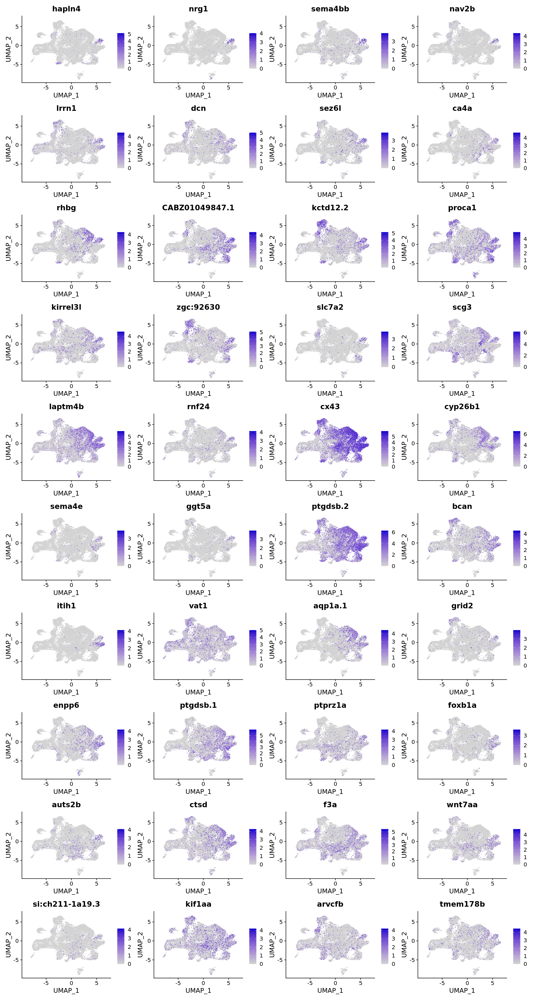

In [11]:
options(repr.plot.width=16, repr.plot.height=30)

FeaturePlot(object = rg_pool, reduction = 'umap', features = cluster_16_top40, 
            ncol = 4, cols = c("lightgrey","mediumblue"),
           raster = FALSE)

In [ ]:
options(repr.plot.width=16, repr.plot.height=30)

FeaturePlot(object = rg_pool, reduction = 'umap', features = cluster_23_top40, 
            ncol = 4, cols = c("lightgrey","mediumblue"),
           raster = FALSE)

Use DotPlot to validate and if necessary refine marker selection.

In [14]:
unique_markers_vector <- unlist(unique_markers)
unique_markers_vector <- unname(unique_markers_vector)
head(unique_markers_vector)

[1] "id2b"       "zgc:153704" "arl5c"      "lipg"       "foxg1a"    
[6] "epd"

In [15]:
shared_markers_vector <- unlist(shared_markers)
shared_markers_vector <- unname(shared_markers_vector)
#remove duplicates
shared_markers_vector <- unique(shared_markers_vector)
head(shared_markers_vector)

[1] "si:ch211-251b21.1" "grm2b"             "mcl1a"            
[4] "cebpd"             "luzp2"             "snap25a"

In [16]:
# plot together
all_markers_vector <- c(unique_markers_vector, shared_markers_vector)
all_markers_vector <- unique(all_markers_vector)

In [116]:
options(repr.plot.width=15, repr.plot.height=40)

dotplot_all <- DotPlot(rg_pool, features = all_markers_vector) + theme(axis.text.x = element_text(angle = 45, size = 16, hjust = 1, vjust = 1), axis.text.y = element_text(size = 16)) + RotatedAxis()
dotplot_all + coord_flip()

ERROR: Error in DotPlot(rg_pool, features = all_markers_vector): object 'all_markers_vector' not found


Warning message in FetchData(object = object, vars = features, cells = cells):
“The following requested variables were not found: si:ch21169b22.5, ndk1, ”


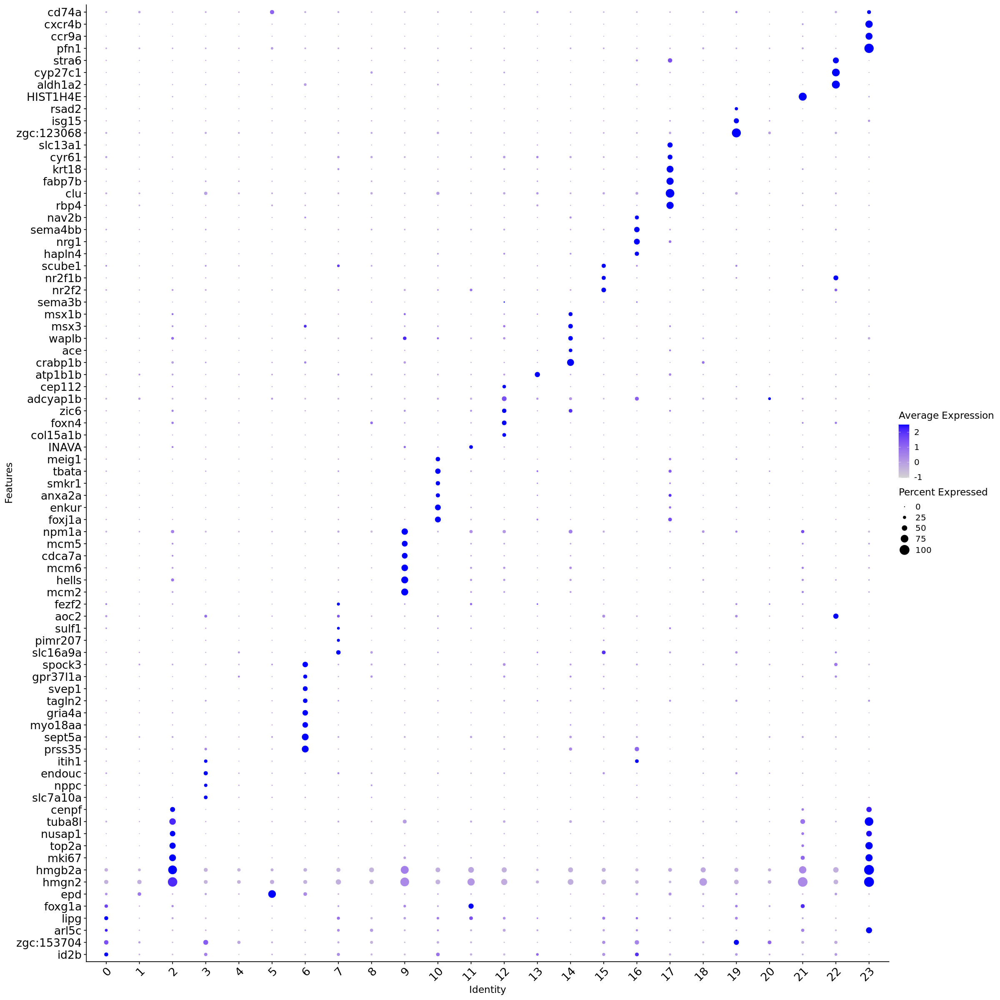

In [117]:
options(repr.plot.width=20, repr.plot.height=20)

dotplot_unique <- DotPlot(rg_pool, features = unique_markers_vector) + theme(axis.text.x = element_text(angle = 45, size = 16, hjust = 1, vjust = 1), axis.text.y = element_text(size = 16)) + RotatedAxis()
dotplot_unique + coord_flip()

Warning message in FetchData(object = object, vars = features, cells = cells):
“The following requested variables were not found: , tenm, fgf3r, procq1”


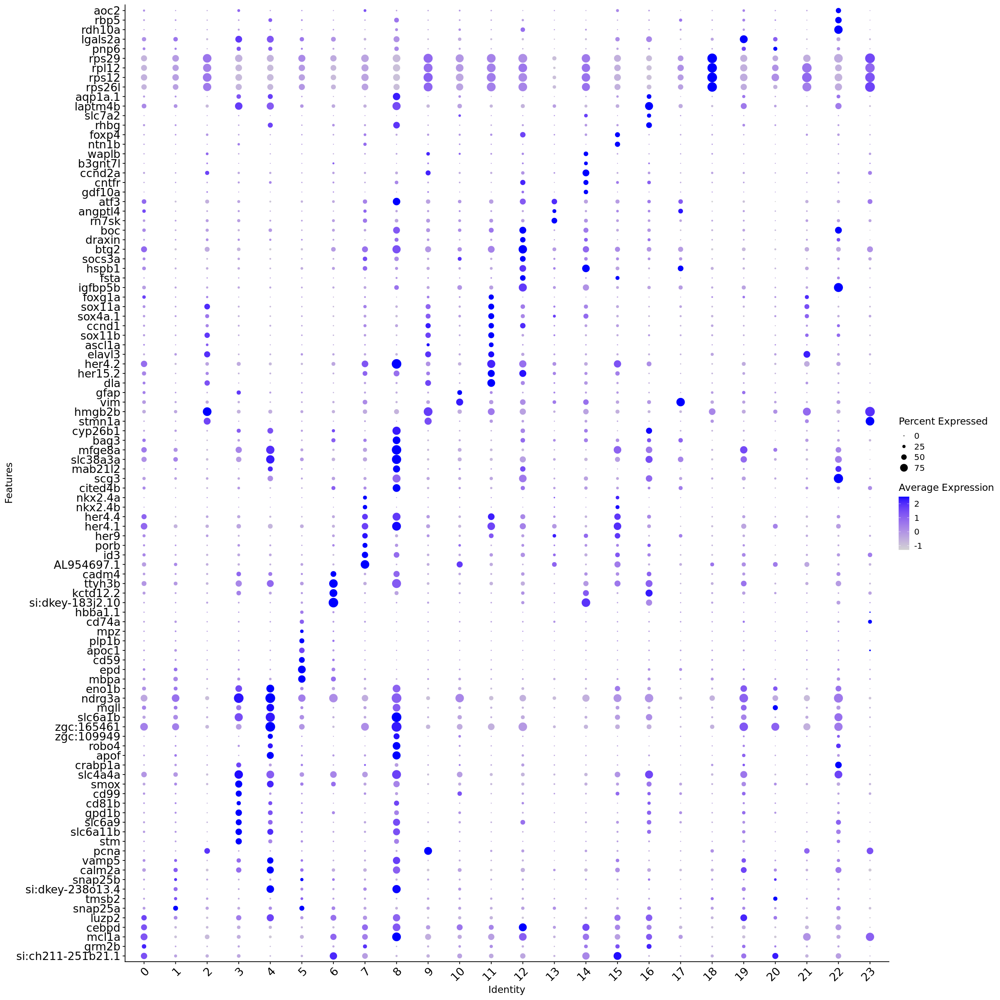

In [119]:
options(repr.plot.width=20, repr.plot.height=20)

dotplot_shared <- DotPlot(rg_pool, features = shared_markers_vector) + theme(axis.text.x = element_text(angle = 45, size = 16, hjust = 1, vjust = 1), axis.text.y = element_text(size = 16)) + RotatedAxis()
dotplot_shared + coord_flip()

#### QC: check fraction of orig.ident per cluster

Before I start merging clusters based on similarity, I want to make sure that all the clusters have at least two libraries supporting them (ie no strong batch effect). Those that exhibit batch effect are good candidates for merging with similar cluster or exclusion from the dataset.    
As a minimal heuristic for now I look into whether any cluster is made >90% of a single library.  

In [121]:
orig.ident.by.cluster <- table(rg_pool$orig.ident, rg_pool$pc28_res0.8_clusters_numeric)

In [122]:
orig.ident.by.cluster[1:5, 1:5]

          
             0   1   2   3   4
  b1_tel   145  15  13   0   0
  b10_cer    9   4   6   0   0
  b10_dien  16  14  22   0   0
  b10_ot    68  87   9   0   8
  b10_tel   14  11   0   0   0

In [123]:
#margin = 1 sums across rows (how is brain reg distributed over clusters)
orig.ident.by.cluster.norm <- round(prop.table(orig.ident.by.cluster, margin = 1), digits = 10)
#orig.ident.by.cluster.norm <- orig.ident.by.cluster.perc1 * 100

In [124]:
orig.ident.by.cluster.norm[1:5, 1:5]

          
                    0          1          2          3          4
  b1_tel   0.53113553 0.05494505 0.04761905 0.00000000 0.00000000
  b10_cer  0.37500000 0.16666667 0.25000000 0.00000000 0.00000000
  b10_dien 0.03030303 0.02651515 0.04166667 0.00000000 0.00000000
  b10_ot   0.22149837 0.28338762 0.02931596 0.00000000 0.02605863
  b10_tel  0.11764706 0.09243697 0.00000000 0.00000000 0.00000000

In [125]:
#margin = 2 sums across columns (which brain regs make up each cluster) - this is what I need for per cluster calculation
#use as input rowwise normalized data
orig.ident.by.cluster.df <- as.data.frame(round(prop.table(orig.ident.by.cluster.norm, margin = 2), digits = 10))
colnames(orig.ident.by.cluster.df) <- c("Brain.reg", "Cluster", "Fraction")

In [126]:
head(orig.ident.by.cluster.df)

,Brain.reg,Cluster,Fraction
,<fct>,<fct>,<dbl>
1,b1_tel,0,0.09453950
2,b10_cer,0,0.06674815
3,b10_dien,0,0.00539379
4,b10_ot,0,0.03942562
5,b10_tel,0,0.02094060
6,b11_mult,0,0.02542787


In [127]:
max(orig.ident.by.cluster.df$Fraction)

[1] 0.7150838

In [129]:
orig.ident.by.cluster.df[which(orig.ident.by.cluster.df$Fraction > 0.3),]

,Brain.reg,Cluster,Fraction
,<fct>,<fct>,<dbl>
185,b7_cer,6,0.3048344
354,b10_dien,13,0.3554434
378,b9_tel,13,0.3677001
537,b7_dien,19,0.3021948
541,b1_tel,20,0.3191179
557,b2_tel,20,0.4042462
577,b15_mult,21,0.7150838
608,b18_mes,22,0.3165373


If the 90% cutoff is applied all would be ok 90%. However looking at the clusters with haigh values some other are still suspicious:  
21 - also known batch effect by technology (5' kit)  
13 - batch effect by method (fixation)  
19, 20 - already on the shortlist for possible merge   
22 - suspected doublet (with origin from library with highest cell numbers!)  

#### Inspect similar clusters for possible difference in markers
It's possible that clusters that appear very similar by markers in the all-vs-all comparison have some subtle difference when compared one-on-one. This is particularly true for small clusters that might appear at high resolution due to some technical artefact. I check for this here. In case valid markers are found, include in final annotation, otherwise merge clusters.  
The cases where no solid markers could be found:   
cluster 4 vs 8  
cluster 5 vs 1  
cluster 15 vs 7 (maybe)   
cluster 18 with 0 or 1   
cluster 19 with 4  
cluster 20 with 0 or 1  
 

In [144]:
table(rg_pool@active.ident)


   0    1    2    3    4    5    6    7    8    9   10   11   12   13   14   15 
2648 2073 1248 1155 1024  984  880  745  666  659  637  630  500  415  407  386 
  16   17   18   19   20   21   22   23 
 384  234  232  139  123   94   75   49 

In [145]:
markers_4_vs_8 <- FindMarkers(rg_pool, ident.1 = 4, ident.2 = 8, 
  min.pct = 0.2, logfc.threshold = 0.2, test.use = "bimod")

In [146]:
markers_4_vs_8$gene <- rownames(markers_4_vs_8)
top_markers_4_vs_8 <- markers_4_vs_8 %>% top_n(n = 20, wt = avg_log2FC) %>% select(gene)
top_markers_4_vs_8 <- as.vector(top_markers_4_vs_8$gene)

In [147]:
top_markers_4_vs_8

[1] "NC-002333.4"      "gapdhs"           "gstp1"            "smox"            
 [5] "abat"             "glula"            "acbd7"            "mt-cyb"          
 [9] "si:ch211-236d3.4" "zgc:158463"       "lgals2a"          "CT027638.1"      
[13] "mt-co3"           "mt-co2"           "NC-002333.17"     "mt-nd4"          
[17] "mt-atp6"          "EGFP"             "mt-co1"           "CR318588.4"

In [ ]:
options(repr.plot.width=16, repr.plot.height=15)

FeaturePlot(object = rg_pool, reduction = 'umap', features = top_markers_4_vs_8, 
            ncol = 4, cols = c("lightgrey","mediumblue"),
           raster = FALSE)

None are very specific in FeaturePlot - conclusion: merge 4 with 8.

In [149]:
markers_5_vs_1 <- FindMarkers(rg_pool, ident.1 = 5, ident.2 = 1, 
  min.pct = 0.2, logfc.threshold = 0.2, test.use = "bimod")

In [150]:
markers_5_vs_1$gene <- rownames(markers_5_vs_1)
top_markers_5_vs_1 <- markers_5_vs_1 %>% top_n(n = 20, wt = avg_log2FC) %>% select(gene)
top_markers_5_vs_1 <- as.vector(top_markers_5_vs_1$gene)

In [151]:
top_markers_5_vs_1

[1] "cd59"             "epd"              "plp1b"            "mbpa"            
 [5] "si:ch211-5k11.8"  "hbba1.1"          "apoc1"            "flj13639"        
 [9] "mpz"              "ccl34b.1"         "cd74a"            "ggctb"           
[13] "stxbp6l"          "si:ch211-286c4.6" "BX936284.1"       "CR318588.4"      
[17] "tmsb4x"           "mcl1a"            "hsp70l"           "dnajb1b"

In [ ]:
options(repr.plot.width=16, repr.plot.height=15)

FeaturePlot(object = rg_pool, reduction = 'umap', features = top_markers_5_vs_1, 
            ncol = 4, cols = c("lightgrey","mediumblue"),
           raster = FALSE)

They are rather similar - one concerning feature however is that many of the markers here are from other cell types, indicating a high level of contamination. Keep an eye for possible issues related to this cluster, however for now also merge 5 with 1.

In [153]:
markers_15_vs_7 <- FindMarkers(rg_pool, ident.1 = 15, ident.2 = 7, 
  min.pct = 0.2, logfc.threshold = 0.2, test.use = "bimod")

In [154]:
markers_15_vs_7$gene <- rownames(markers_15_vs_7)
top_markers_15_vs_7 <- markers_15_vs_7 %>% top_n(n = 20, wt = avg_log2FC) %>% select(gene)
top_markers_15_vs_7 <- as.vector(top_markers_15_vs_7$gene)

In [155]:
top_markers_15_vs_7

[1] "nr2f1b"            "slc7a11"           "si:ch211-251b21.1"
 [4] "slc1a2b"           "fgfr3"             "psap"             
 [7] "glula"             "mfge8a"            "fsta"             
[10] "clstn2"            "epha7"             "nr2f2"            
[13] "arhgdig"           "sema3ab"           "ttyh3b"           
[16] "cspg5b"            "gas1b"             "foxp4"            
[19] "ntn1b"             "cxcl14"

In [ ]:
options(repr.plot.width=16, repr.plot.height=15)

FeaturePlot(object = rg_pool, reduction = 'umap', features = top_markers_15_vs_7, 
            ncol = 4, cols = c("lightgrey","mediumblue"),
           raster = FALSE)

In this case a few specific genes present for 15 - keep separate.  

In [157]:
markers_18_vs_0 <- FindMarkers(rg_pool, ident.1 = 18, ident.2 = 0, 
  min.pct = 0.2, logfc.threshold = 0.2, test.use = "bimod")

In [158]:
markers_18_vs_0$gene <- rownames(markers_18_vs_0)
top_markers_18_vs_0 <- markers_18_vs_0 %>% top_n(n = 20, wt = avg_log2FC) %>% select(gene)
top_markers_18_vs_0 <- as.vector(top_markers_18_vs_0$gene)

In [159]:
top_markers_18_vs_0

[1] "rps24"      "rps29"      "uba52"      "rps26l"     "rpl12"     
 [6] "rpl36a"     "rpl31"      "rps14"      "rps23"      "rpl37.1"   
[11] "rpl13"      "zgc:171772" "rpl14"      "rps13"      "rps12"     
[16] "rplp2l"     "rpl13a"     "rplp0"      "rps21"      "rpl22l1"

In [ ]:
options(repr.plot.width=16, repr.plot.height=15)

FeaturePlot(object = rg_pool, reduction = 'umap', features = top_markers_18_vs_0, 
            ncol = 4, cols = c("lightgrey","mediumblue"),
           raster = FALSE)

In [161]:
markers_18_vs_1 <- FindMarkers(rg_pool, ident.1 = 18, ident.2 = 1, 
  min.pct = 0.2, logfc.threshold = 0.2, test.use = "bimod")

In [162]:
markers_18_vs_1$gene <- rownames(markers_18_vs_1)
top_markers_18_vs_1 <- markers_18_vs_1 %>% top_n(n = 20, wt = avg_log2FC) %>% select(gene)
top_markers_18_vs_1 <- as.vector(top_markers_18_vs_1$gene)

In [163]:
top_markers_18_vs_1

[1] "rps24"      "rps26l"     "rpl12"      "rplp0"      "rps29"     
 [6] "rps12"      "uba52"      "rpl36a"     "rplp2l"     "rps23"     
[11] "rplp1"      "rps13"      "rpl37.1"    "rpl31"      "rpl13"     
[16] "rps28"      "rps21"      "rpl14"      "FO704736.1" "rpl22l1"

In [ ]:
options(repr.plot.width=16, repr.plot.height=15)

FeaturePlot(object = rg_pool, reduction = 'umap', features = top_markers_18_vs_1, 
            ncol = 4, cols = c("lightgrey","mediumblue"),
           raster = FALSE)

Really weird cluster - equally similar (or not) to both. Keep it separate for now to indicate its ID. Also now I have a few more specific genes for marker representation: rps21, rpl14, rpl22l1, rps28, rpl31.  


In [165]:
markers_19_vs_4 <- FindMarkers(rg_pool, ident.1 = 19, ident.2 = 4, 
  min.pct = 0.2, logfc.threshold = 0.2, test.use = "bimod")

In [166]:
markers_19_vs_4$gene <- rownames(markers_19_vs_4)
top_markers_19_vs_4 <- markers_19_vs_4 %>% top_n(n = 20, wt = avg_log2FC) %>% select(gene)
top_markers_19_vs_4 <- as.vector(top_markers_19_vs_4$gene)

In [167]:
top_markers_19_vs_4

[1] "zgc:123068"        "si:dkey-188i13.7"  "isg15"            
 [4] "zgc:152791"        "si:ch211-251b21.1" "CU984600.2"       
 [7] "b2m"               "si:dkey-188i13.10" "zgc:153704"       
[10] "rsad2"             "si:ch211-24o10.6"  "s100a10b"         
[13] "CR318588.4"        "si:ch211-132p1.3"  "txn"              
[16] "CR318588.1"        "stat2"             "grm2b"            
[19] "AL954697.1"        "fosab"

In [ ]:
options(repr.plot.width=16, repr.plot.height=15)

FeaturePlot(object = rg_pool, reduction = 'umap', features = top_markers_19_vs_4, 
            ncol = 4, cols = c("lightgrey","mediumblue"),
           raster = FALSE)

Even though it's a small cluster it has at least a few unique markers: rsad2, stat2, isg15 + a few of the unnamed transcripts. Keep separate for now but keep an eye on it.  

In [169]:
markers_20_vs_0 <- FindMarkers(rg_pool, ident.1 = 20, ident.2 = 0, 
  min.pct = 0.2, logfc.threshold = 0.2, test.use = "bimod")

In [170]:
markers_20_vs_0$gene <- rownames(markers_20_vs_0)
top_markers_20_vs_0 <- markers_20_vs_0 %>% top_n(n = 20, wt = avg_log2FC) %>% select(gene)
top_markers_20_vs_0 <- as.vector(top_markers_20_vs_0$gene)

In [171]:
top_markers_20_vs_0

[1] "ppdpfb"     "rps2"       "slc25a5"    "rpl3"       "rpl18a"    
 [6] "rpl7"       "rpl7a"      "rplp0"      "pabpc1a"    "rps6"      
[11] "rpl26.1"    "fth1a"      "gng3"       "CR318588.4" "mibp2"     
[16] "eef1da"     "tmsb2"      "pcp4a"      "gap43"      "adcyap1b"

In [ ]:
options(repr.plot.width=16, repr.plot.height=15)

FeaturePlot(object = rg_pool, reduction = 'umap', features = top_markers_20_vs_0, 
            ncol = 4, cols = c("lightgrey","mediumblue"),
           raster = FALSE)

In [173]:
markers_20_vs_1 <- FindMarkers(rg_pool, ident.1 = 20, ident.2 = 1, 
  min.pct = 0.2, logfc.threshold = 0.2, test.use = "bimod")

In [174]:
markers_20_vs_1$gene <- rownames(markers_20_vs_1)
top_markers_20_vs_1 <- markers_20_vs_1 %>% top_n(n = 20, wt = avg_log2FC) %>% select(gene)
top_markers_20_vs_1 <- as.vector(top_markers_20_vs_1$gene)

In [175]:
top_markers_20_vs_1

[1] "rpl3"              "ppdpfb"            "rps2"             
 [4] "slc25a5"           "rpl18a"            "rpl26.1"          
 [7] "rps6"              "rpl7a"             "pabpc1a"          
[10] "rplp0"             "scg5"              "ptgdsb.1"         
[13] "si:ch211-251b21.1" "eif3f"             "mibp2"            
[16] "gng3"              "eef1da"            "her4.1"           
[19] "adcyap1b"          "gap43"

In [ ]:
options(repr.plot.width=16, repr.plot.height=15)

FeaturePlot(object = rg_pool, reduction = 'umap', features = top_markers_20_vs_1, 
            ncol = 4, cols = c("lightgrey","mediumblue"),
           raster = FALSE)

Not very distinct from nor similar to either - most markers have a salt-and-pepper-y expression and are in fact not even super specific for the cluster. Rather in favour of it being rather a technical artefact than a biologically valid cluster. It's still not very clear where to merge it but based on  UMAP position I will add it to cluster 1.  

### Quantify regional specificity per cluster

Do this iteratively while checking markers and possible merges/exclusions in the section above. Final version will be made when I decide on the final clustering.

In [13]:
# pallette for brain regions based on https://colorbrewer2.org/#type=qualitative&scheme=Accent&n=5
reg_colors <- c("tel" = "#7fc97f", #green
                "dien" = "#beaed4", #purple
                "mes" = "#fdc086", #orange
                "rhom" = "#ffff99", #yellow
                "whole" = "#386cb0" #blue
                )

In [132]:
brain.reg.by.cluster <- table(rg_pool$brain_reg, rg_pool$pc28_res0.8_clusters_numeric)

In [133]:
brain.reg.by.cluster

       
           0    1    2    3    4    5    6    7    8    9   10   11   12   13
  dien   159  194  107  107   15  119   44  198    8   52   90   29   34  319
  mes    222  859   55   46  241  131    1   34  211   25  157   36  182    0
  rhom   113   44  133  242    4  158  236    4    1   46   28   17    6    0
  tel    594  262  116   27    4   14    0   49    1   78  101  113    6   96
  whole 1560  714  837  733  760  562  599  460  445  458  261  435  272    0
       
          14   15   16   17   18   19   20   21   22   23
  dien    30   62   17   72   14   23    0    0    5    5
  mes      6    2    3    0   13   41    0    0   38    2
  rhom    80    2  104    6   67    3    0    0    0    3
  tel      0   15    1  107    4   24  121    0    1    5
  whole  291  305  259   49  134   48    2   94   31   34

In [134]:
#margin = 1 sums across rows (how is brain reg distributed over clusters)
brain.reg.by.cluster.norm <- round(prop.table(brain.reg.by.cluster, margin = 1), digits = 10)
#brain.reg.by.cluster.norm <- brain.reg.by.cluster.perc1 * 100

In [135]:
brain.reg.by.cluster.norm

       
                   0            1            2            3            4
  dien  0.0933646506 0.1139166177 0.0628302995 0.0628302995 0.0088079859
  mes   0.0963123644 0.3726681128 0.0238611714 0.0199566161 0.1045553145
  rhom  0.0871241326 0.0339244410 0.1025443331 0.1865844256 0.0030840401
  tel   0.3415756182 0.1506612996 0.0667050029 0.0155261645 0.0023001725
  whole 0.1669699240 0.0764208498 0.0895857862 0.0784544579 0.0813443220
       
                   5            6            7            8            9
  dien  0.0698766882 0.0258367587 0.1162654140 0.0046975925 0.0305343511
  mes   0.0568329718 0.0004338395 0.0147505423 0.0915401302 0.0108459870
  rhom  0.1218195837 0.1819583655 0.0030840401 0.0007710100 0.0354664611
  tel   0.0080506038 0.0000000000 0.0281771133 0.0005750431 0.0448533640
  whole 0.0601519854 0.0641121695 0.0492347212 0.0476292411 0.0490206572
       
                  10           11           12           13           14
  dien  0.0528479154 0.0170

In [136]:
#margin = 2 sums across columns (which brain regs make up each cluster) - this is what I need for per cluster calculation
#use as input rowwise normalized data
brain.reg.by.cluster.df <- as.data.frame(round(prop.table(brain.reg.by.cluster.norm, margin = 2), digits = 10))
colnames(brain.reg.by.cluster.df) <- c("Brain.reg", "Cluster", "Fraction")

In [137]:
head(brain.reg.by.cluster.df)

,Brain.reg,Cluster,Fraction
,<fct>,<fct>,<dbl>
1,dien,0,0.1188834
2,mes,0,0.1226367
3,rhom,0,0.1109372
4,tel,0,0.4349361
5,whole,0,0.2126066
6,dien,1,0.1523782


In [138]:
max(brain.reg.by.cluster.df$Fraction)

[1] 1

In [139]:
p_br <- ggplot(data = brain.reg.by.cluster.df, aes(x = Cluster, y = Fraction, fill = Brain.reg)) + geom_bar(stat="identity") + 
coord_cartesian(ylim = c(0,1)) + labs(x="Cluster", y="Fraction") +  
theme(axis.title = element_text(size = 18), axis.text = element_text(size = 16),   plot.title = element_text(size = 16, hjust = 0.5))  + 
coord_flip() + scale_fill_manual(values = reg_colors)

Coordinate system already present. Adding new coordinate system, which will replace the existing one.



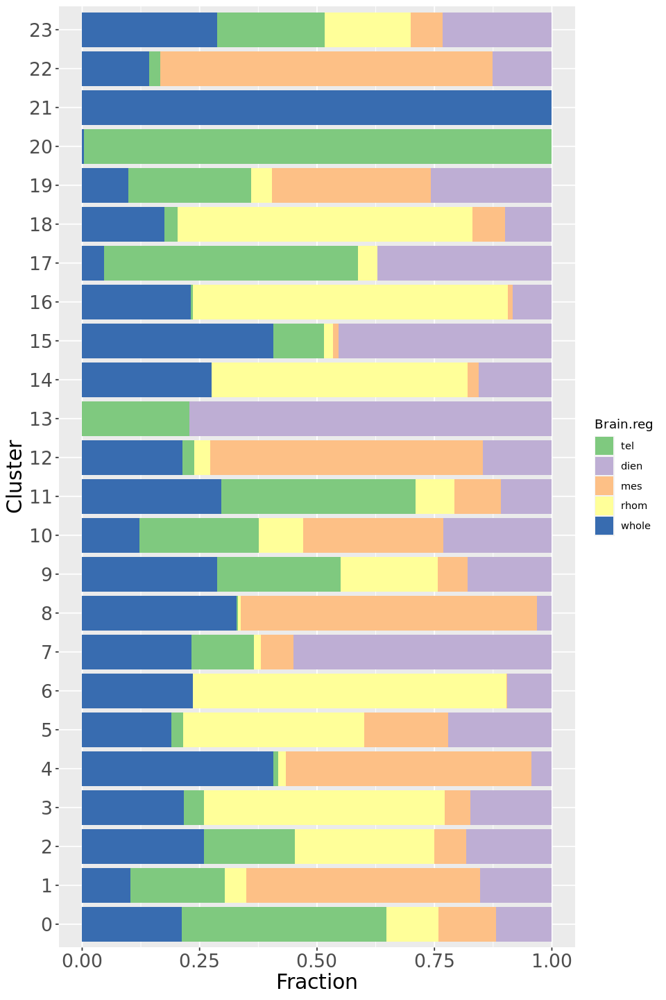

In [140]:
options(repr.plot.width=8, repr.plot.height=12)

p_br


### Annotate clusters

#### Step 1: reorder numeric cluster names

In [130]:
# save original numeric names
#rg_pool$pc28_res0.8_clusters_numeric<- Idents(rg_pool)

In [204]:
# if needed to restore original numeric cluster names
Idents(rg_pool) <- rg_pool$pc28_res0.8_clusters_numeric

In [205]:
table(rg_pool$pc28_res0.8_clusters_numeric)


   0    1    2    3    4    5    6    7    8    9   10   11   12   13   14   15 
2648 2073 1248 1155 1024  984  880  745  666  659  637  630  500  415  407  386 
  16   17   18   19   20   21   22   23 
 384  234  232  139  123   94   75   49 

In [207]:
# add numeric names that reflect final clustering with manual corrections
# add +1 to cluster names so they start with 1 (I prefer this for the manuscript figure)
# manually merge clusters that co-localize on UMAP and show no sufficient marker distinction
# former clusters 4 and 8 are merged with 0 and all renamed as "5"
# former cluster 5 is merged into old 1 (now 2)
# former cluster 20 is merged into old 1 (now 2)
# also reorder: move 13 to the end so it gets excluded more easily without affecting the plot (this is the fixation batch effect cluster)
# similarly: move 21 to the end (batch effect 5' kit)

rg_pool <- RenameIdents(object = rg_pool, 
                        "0" = "1",
                         "1" = "2",
                         "2" = "3",
                         "3" = "4",
                         "4" = "5",
                         "5" = "2", #merge with former 1
                         "6" = "6",
                         "7" = "7",
                         "8" = "5", #merge with former 4
                         "9" = "8",
                         "10" = "9",
                         "11" = "10",
                         "12" = "11",
                         "13" = "20", #move closer to the end of numbers sequence - will be excluded
                         "14" = "12",
                         "15" = "13",
                         "16" = "14",
                         "17" = "15",
                         "18" = "16",
                         "19" = "17",
                        "20" = "2",
                        "21" = "21", #move to the end - will be excluded
                        "22" = "18",
                        "23" = "19" #will be excluded
                        )

#stash
rg_pool[["pc28_res0.8_clusters_numeric_edited"]] <- Idents(object = rg_pool)

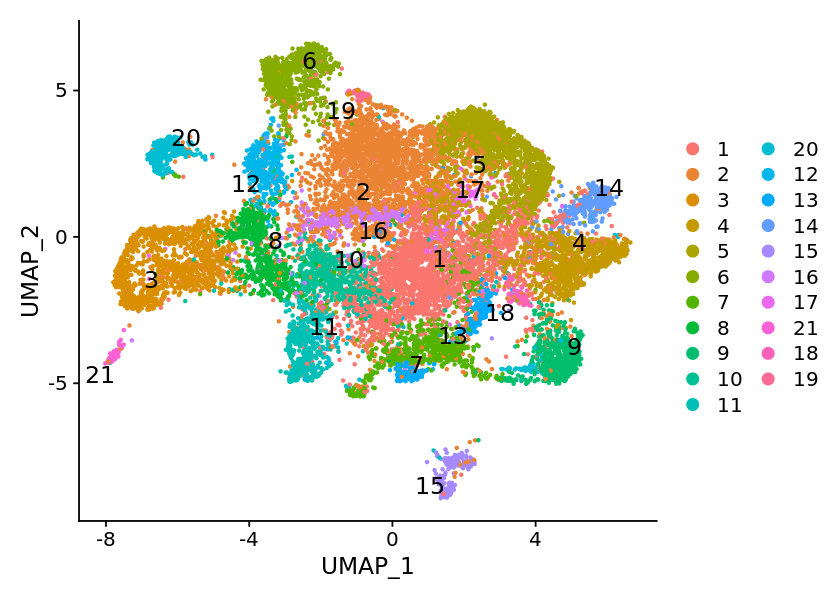

In [208]:
options(repr.plot.width=7, repr.plot.height=5)

DimPlot(object = rg_pool, reduction = 'umap', label = TRUE, label.size = 5, pt.size = 0.6, repel = TRUE)

#most clusters look okay except 2 which is not centered - may benefit from further reclustering
# 20 has the same issue

#### Step 2: recalculate fraction brain region + replot markers

##### Brain region

In [7]:
brain.reg.by.cluster <- table(rg_pool$brain_reg, rg_pool$pc28_res0.8_clusters_numeric_edited)

In [8]:
brain.reg.by.cluster.diss <- brain.reg.by.cluster[c(1:4),]
brain.reg.by.cluster.diss

      
         1   2   3   4   5   6   7   8   9  10  11  20  12  13  14  15  16  17
  dien 159 313 107 107  23  44 198  52  90  29  34 319  30  62  17  72  14  23
  mes  222 990  55  46 452   1  34  25 157  36 182   0   6   2   3   0  13  41
  rhom 113 202 133 242   5 236   4  46  28  17   6   0  80   2 104   6  67   3
  tel  594 397 116  27   5   0  49  78 101 113   6  96   0  15   1 107   4  24
      
        21  18  19
  dien   0   5   5
  mes    0  38   2
  rhom   0   0   3
  tel    0   1   5

In [9]:
#margin = 1 sums across rows (how is brain reg distributed over clusters)
brain.reg.by.cluster.diss.norm <- round(prop.table(brain.reg.by.cluster.diss, margin = 1), digits = 10)
#brain.reg.by.cluster.norm <- brain.reg.by.cluster.perc1 * 100

In [10]:
brain.reg.by.cluster.diss.norm

      
                  1            2            3            4            5
  dien 0.0933646506 0.1837933059 0.0628302995 0.0628302995 0.0135055784
  mes  0.0963123644 0.4295010846 0.0238611714 0.0199566161 0.1960954447
  rhom 0.0871241326 0.1557440247 0.1025443331 0.1865844256 0.0038550501
  tel  0.3415756182 0.2282921219 0.0667050029 0.0155261645 0.0028752156
      
                  6            7            8            9           10
  dien 0.0258367587 0.1162654140 0.0305343511 0.0528479154 0.0170287728
  mes  0.0004338395 0.0147505423 0.0108459870 0.0681127983 0.0156182213
  rhom 0.1819583655 0.0030840401 0.0354664611 0.0215882806 0.0131071704
  tel  0.0000000000 0.0281771133 0.0448533640 0.0580793560 0.0649798735
      
                 11           20           12           13           14
  dien 0.0199647681 0.1873165003 0.0176159718 0.0364063417 0.0099823840
  mes  0.0789587852 0.0000000000 0.0026030369 0.0008676790 0.0013015184
  rhom 0.0046260601 0.0000000000 0.06168080

In [11]:
#margin = 2 sums across columns (which brain regs make up each cluster) - this is what I need for per cluster calculation
#use as input rowwise normalized data
brain.reg.by.cluster.diss.df <- as.data.frame(round(prop.table(brain.reg.by.cluster.diss.norm, margin = 2), digits = 10))
colnames(brain.reg.by.cluster.diss.df) <- c("Brain.reg", "Cluster", "Fraction")

In [12]:
head(brain.reg.by.cluster.diss.df)

,Brain.reg,Cluster,Fraction
,<fct>,<fct>,<dbl>
1,dien,1,0.1509834
2,mes,1,0.1557503
3,rhom,1,0.1408917
4,tel,1,0.5523746
5,dien,2,0.1842852
6,mes,2,0.4306507


In [13]:
# pallette for brain regions based on https://colorbrewer2.org/#type=qualitative&scheme=Accent&n=5
reg_colors <- c("tel" = "#7fc97f", #green
                "dien" = "#beaed4", #purple
                "mes" = "#fdc086", #orange
                "rhom" = "#ffff99", #yellow
                "whole" = "#386cb0" #blue
                )

In [14]:
p_br_diss <- ggplot(data = brain.reg.by.cluster.diss.df, aes(x = Cluster, y = Fraction, fill = Brain.reg)) + 
    geom_bar(stat="identity") + 
    coord_cartesian(ylim = c(0,1)) + 
    labs(x="Cluster", y="Fraction") +  
    theme(axis.title = element_text(size = 18), axis.text = element_text(size = 16), plot.title = element_text(size = 16, hjust = 0.5))  + 
    coord_flip() + scale_fill_manual(values = reg_colors)

Coordinate system already present. Adding new coordinate system, which will replace the existing one.



Warning message:
“Removed 4 rows containing missing values (position_stack).”


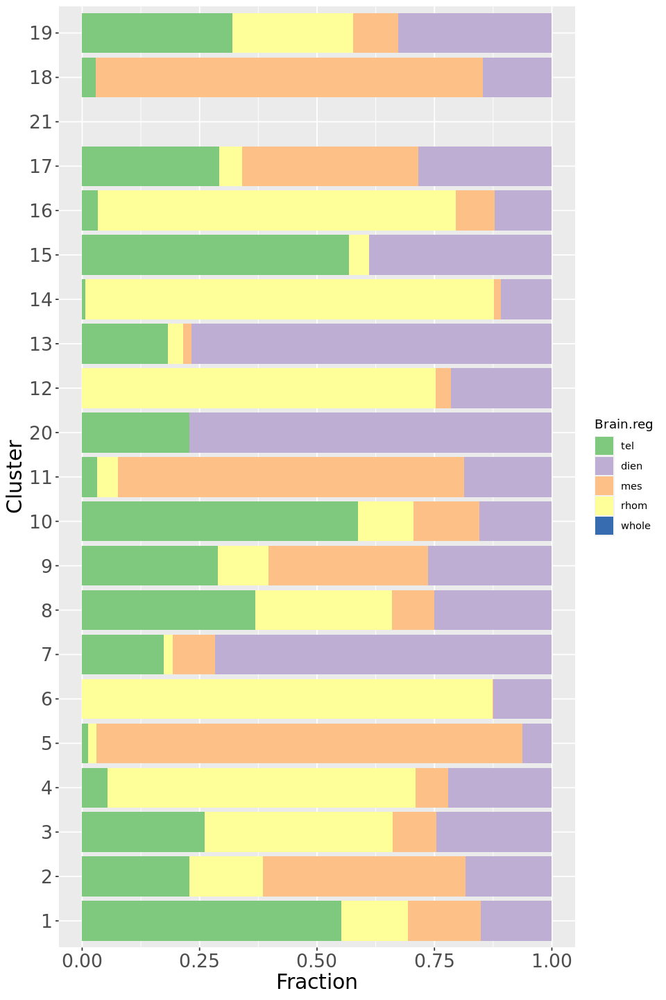

In [15]:
options(repr.plot.width=8, repr.plot.height=12)

p_br_diss

One big drawback of this clustering compared to the previous version: no telencephalon-specific regional state can be found!!  
This would require a big change in the data interpretation and framing of the manuscript.  

For a more quantitative overview I want to decide regional specificity based on a cutoff.  
First I plot max fraction for each cluster to get an idea of a cutoff value that would make sense (ideally aiming for around 70% to account for 10% contamination from each of the other regions + keep it consistent with what I do for RG).

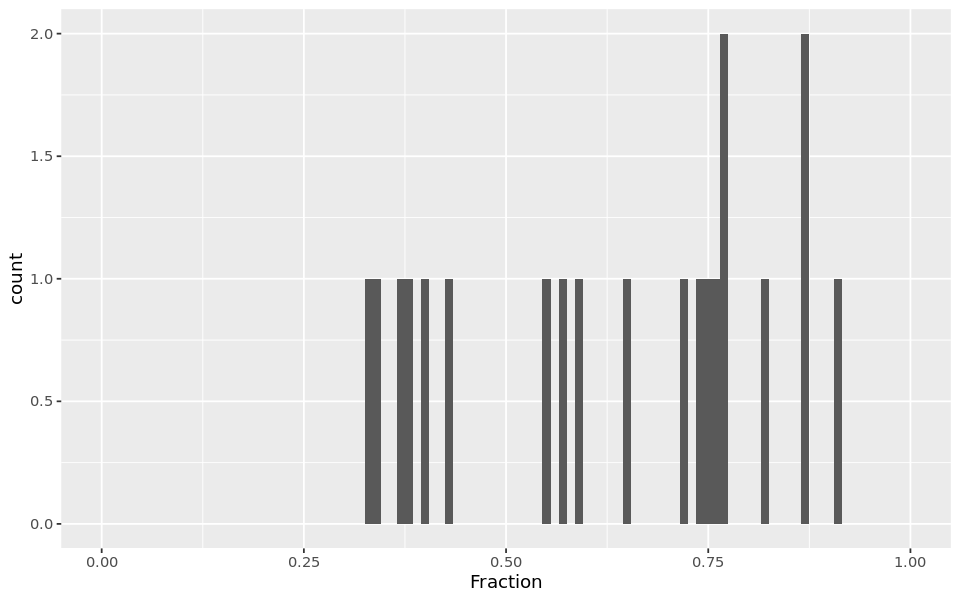

In [16]:
options(repr.plot.width=8, repr.plot.height=5)

rg.reg.spec <- aggregate(Fraction ~ Cluster, brain.reg.by.cluster.diss.df, max)
#merge with original table to find corresponding brain region (will fail if there are duplicate values)
#what's a good cutoff point? plot histogram of max fractions
rg.reg.spec <- merge(rg.reg.spec, brain.reg.by.cluster.diss.df)
ggplot(rg.reg.spec, aes(x = Fraction)) + geom_histogram(binwidth = 0.01) + coord_cartesian(xlim = c(0,1))

In [17]:
#I'll go for 0.7 for now, if I notice some issues with this I will increase to higher cutoff in the future
rg.reg.spec$Is.specific <- rg.reg.spec$Fraction > 0.7

#on the opposite side, there are some clusters with really appreciable good mixing across regions, that should certainly be called global ie those where the maximum fraction is lower that 50%
#not useful for now
#rg.reg.spec$Is.global <- rg.reg.spec$Fraction < 0.5

In [18]:
rg.reg.spec

Cluster,Fraction,Brain.reg,Is.specific
<fct>,<dbl>,<fct>,<lgl>
1,0.5523746,tel,FALSE
10,0.5868103,tel,FALSE
11,0.7379335,mes,TRUE
12,0.7531251,rhom,TRUE
13,0.7673914,dien,TRUE
14,0.8711600,rhom,TRUE
15,0.5674384,tel,FALSE
16,0.7617042,rhom,TRUE
17,0.3752061,mes,FALSE


Newer version: for some of the downstream plotting it would be helpful to have a separate metadata entry for the fraction of each brain region per cluster. So I reformat the original table with the fractions for each cluster.  

In [19]:
library(data.table)


Attaching package: ‘data.table’


The following objects are masked from ‘package:dplyr’:

    between, first, last




In [20]:
brain.reg.by.cluster.df.wide <- dcast(brain.reg.by.cluster.diss.df, 
                                      Cluster ~ Brain.reg, value.var = "Fraction")
head(brain.reg.by.cluster.df.wide)

Warning message in dcast(brain.reg.by.cluster.diss.df, Cluster ~ Brain.reg, value.var = "Fraction"):
“The dcast generic in data.table has been passed a data.frame and will attempt to redirect to the reshape2::dcast; please note that reshape2 is deprecated, and this redirection is now deprecated as well. Please do this redirection yourself like reshape2::dcast(brain.reg.by.cluster.diss.df). In the next version, this warning will become an error.”


,Cluster,dien,mes,rhom,tel
,<fct>,<dbl>,<dbl>,<dbl>,<dbl>
1,1,0.15098344,0.155750296,0.14089167,0.55237460
2,2,0.18428525,0.430650691,0.15616089,0.22890317
3,3,0.24548762,0.093229257,0.40065644,0.26062668
4,4,0.22053650,0.070048406,0.65491772,0.05449737
5,5,0.06243007,0.906459005,0.01782012,0.01329080
6,6,0.12407860,0.002083473,0.87383792,0.00000000


In [21]:
# round to only 2 decimal places
brain.reg.by.cluster.df.wide[,-1] <-round(brain.reg.by.cluster.df.wide[,-1],2)
head(brain.reg.by.cluster.df.wide)

,Cluster,dien,mes,rhom,tel
,<fct>,<dbl>,<dbl>,<dbl>,<dbl>
1,1,0.15,0.16,0.14,0.55
2,2,0.18,0.43,0.16,0.23
3,3,0.25,0.09,0.40,0.26
4,4,0.22,0.07,0.65,0.05
5,5,0.06,0.91,0.02,0.01
6,6,0.12,0.00,0.87,0.00


In [22]:
brain.reg.by.cluster.df.wide$Max_fraction <- apply(brain.reg.by.cluster.df.wide[,c(2:5)], 1, max)
brain.reg.by.cluster.df.wide$Max_region <- colnames(brain.reg.by.cluster.df.wide[,c(2:5)])[max.col(brain.reg.by.cluster.df.wide[,c(2:5)], ties.method = "first")]
head(brain.reg.by.cluster.df.wide)

,Cluster,dien,mes,rhom,tel,Max_fraction,Max_region
,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
1,1,0.15,0.16,0.14,0.55,0.55,tel
2,2,0.18,0.43,0.16,0.23,0.43,mes
3,3,0.25,0.09,0.40,0.26,0.40,rhom
4,4,0.22,0.07,0.65,0.05,0.65,rhom
5,5,0.06,0.91,0.02,0.01,0.91,mes
6,6,0.12,0.00,0.87,0.00,0.87,rhom


In [23]:
table(brain.reg.by.cluster.df.wide$Max_region)


dien  mes rhom  tel 
   4    6    6    4 

In [24]:
# check for NAs (present when cluster composed only of whole brain samples)
brain.reg.by.cluster.df.wide[which(is.na(brain.reg.by.cluster.df.wide$Max_region)),]

,Cluster,dien,mes,rhom,tel,Max_fraction,Max_region
,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
19,21,NaN,NaN,NaN,NaN,NaN,NA


In [25]:
# rewrite NAs as "unknown"
brain.reg.by.cluster.df.wide[which(is.na(brain.reg.by.cluster.df.wide$Max_region)),]$Max_region <- "Unknown"
table(brain.reg.by.cluster.df.wide$Max_region)


   dien     mes    rhom     tel Unknown 
      4       6       6       4       1 

In [26]:
# rewrite remaining NaNs as 0
brain.reg.by.cluster.df.wide[is.na(brain.reg.by.cluster.df.wide)] <- 0

In [27]:
tail(brain.reg.by.cluster.df.wide)

,Cluster,dien,mes,rhom,tel,Max_fraction,Max_region
,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
16,15,0.39,0.00,0.04,0.57,0.57,tel
17,16,0.12,0.08,0.76,0.03,0.76,rhom
18,17,0.28,0.38,0.05,0.29,0.38,mes
19,21,0.00,0.00,0.00,0.00,0.00,Unknown
20,18,0.15,0.82,0.00,0.03,0.82,mes
21,19,0.33,0.10,0.26,0.32,0.33,dien


In [28]:
# add final column that combines name of region with percentage
brain.reg.by.cluster.df.wide$Region_max_fraction <- paste0(brain.reg.by.cluster.df.wide$Max_region, "_", brain.reg.by.cluster.df.wide$Max_fraction)
head(brain.reg.by.cluster.df.wide)

,Cluster,dien,mes,rhom,tel,Max_fraction,Max_region,Region_max_fraction
,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
1,1,0.15,0.16,0.14,0.55,0.55,tel,tel_0.55
2,2,0.18,0.43,0.16,0.23,0.43,mes,mes_0.43
3,3,0.25,0.09,0.40,0.26,0.40,rhom,rhom_0.4
4,4,0.22,0.07,0.65,0.05,0.65,rhom,rhom_0.65
5,5,0.06,0.91,0.02,0.01,0.91,mes,mes_0.91
6,6,0.12,0.00,0.87,0.00,0.87,rhom,rhom_0.87


In [29]:
#change column names
colnames(brain.reg.by.cluster.df.wide)[2:5] <- c("Fraction_dien", "Fraction_mes", "Fraction_rhom", "Fraction_tel")
head(brain.reg.by.cluster.df.wide)

,Cluster,Fraction_dien,Fraction_mes,Fraction_rhom,Fraction_tel,Max_fraction,Max_region,Region_max_fraction
,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
1,1,0.15,0.16,0.14,0.55,0.55,tel,tel_0.55
2,2,0.18,0.43,0.16,0.23,0.43,mes,mes_0.43
3,3,0.25,0.09,0.40,0.26,0.40,rhom,rhom_0.4
4,4,0.22,0.07,0.65,0.05,0.65,rhom,rhom_0.65
5,5,0.06,0.91,0.02,0.01,0.91,mes,mes_0.91
6,6,0.12,0.00,0.87,0.00,0.87,rhom,rhom_0.87


##### Markers

Replot markers (dataset-specific).

In [ ]:
# add markers to dotplot that were found in the cluster by cluster exploration!

Warning message in FetchData(object = object, vars = features, cells = cells):
“The following requested variables were not found: si:ch21169b22.5, ndk1, ”


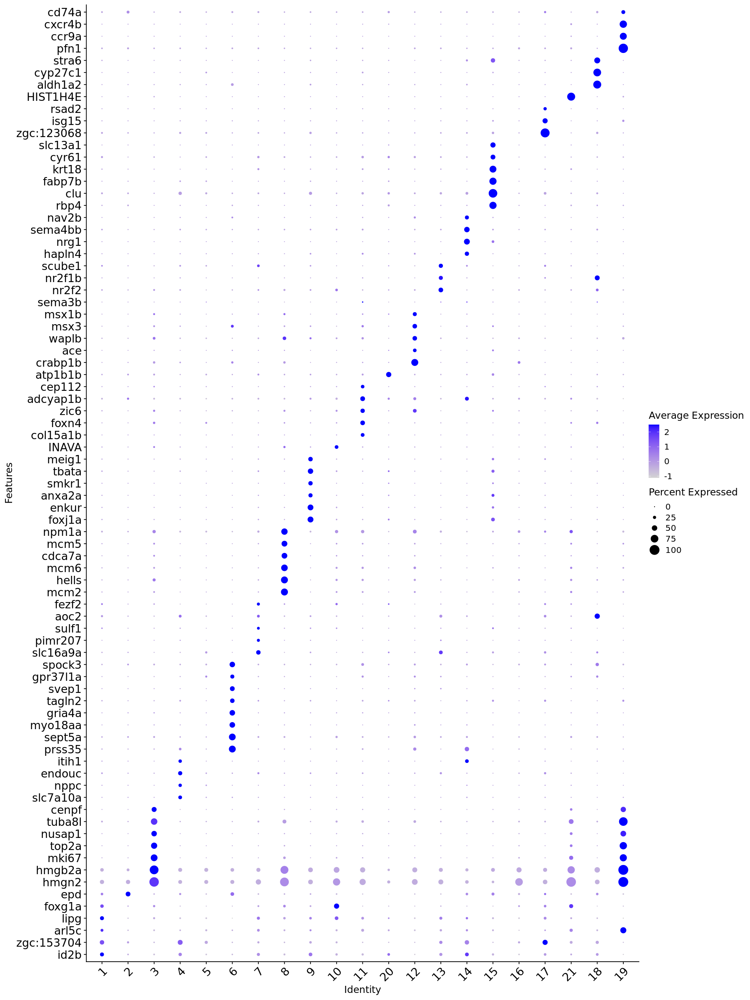

In [199]:
options(repr.plot.width=15, repr.plot.height=20)

dotplot_unique <- DotPlot(rg_pool, features = unique_markers_vector) + theme(axis.text.x = element_text(angle = 45, size = 16, hjust = 1, vjust = 1), axis.text.y = element_text(size = 16)) + RotatedAxis()
dotplot_unique + coord_flip()

Warning message in FetchData(object = object, vars = features, cells = cells):
“The following requested variables were not found: , tenm, fgf3r, procq1”


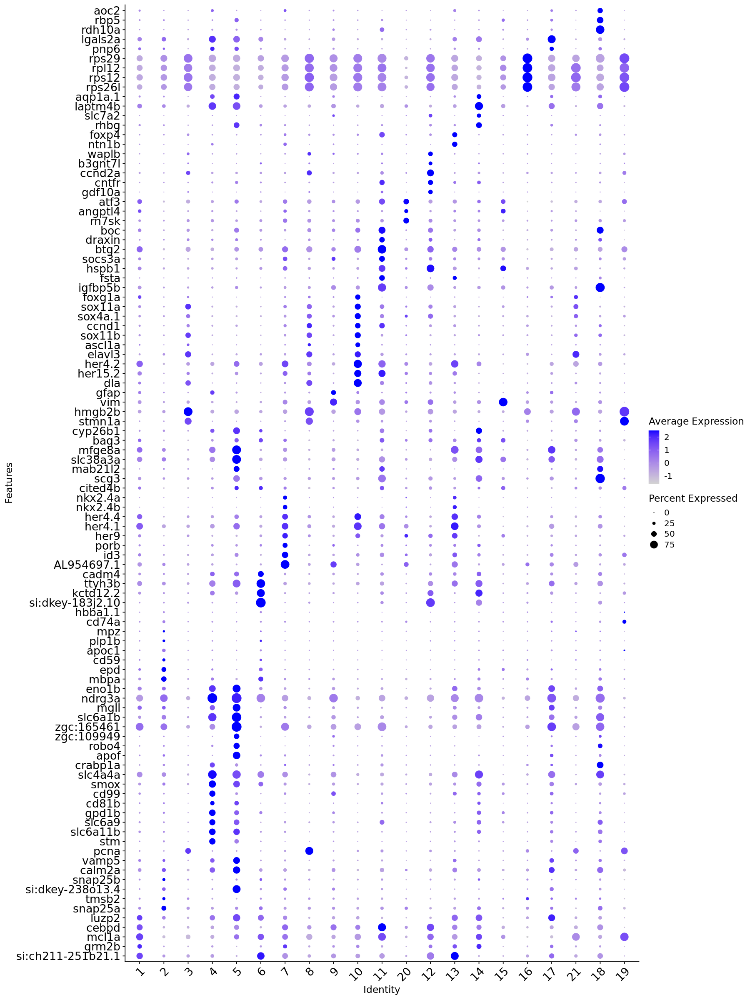

In [200]:
options(repr.plot.width=15, repr.plot.height=20)

dotplot_shared <- DotPlot(rg_pool, features = shared_markers_vector) + theme(axis.text.x = element_text(angle = 45, size = 16, hjust = 1, vjust = 1), axis.text.y = element_text(size = 16)) + RotatedAxis()
dotplot_shared + coord_flip()

#### Step 3: assign biologically meaningful cluster names
Based on region and marker.

In [4]:
# restore "corrected" numeric cluster names
Idents(rg_pool) <- rg_pool$pc28_res0.8_clusters_numeric_edited

In [5]:
table(rg_pool@active.ident)


   1    2    3    4    5    6    7    8    9   10   11   20   12   13   14   15 
2648 3180 1248 1155 1690  880  745  659  637  630  500  415  407  386  384  234 
  16   17   21   18   19 
 232  139   94   75   49 

In [6]:
rg_pool <- RenameIdents(object = rg_pool, 
                         "1" = "Radial glia id2b+",  
                         "2" = "Radial glia snap25a+",  
                         "3" = "Proliferating cells mki67+",  
                         "4" = "Radial glia nppc+", 
                         "5" = "Radial glia apof+ (mes)", 
                         "6" = "Radial glia prss35+ (rhom)", 
                         "7" = "Radial glia id3+ (dien)", 
                         "8" = "Proliferating cells mcm6+", 
                         "9" = "Radial glia enkur+", 
                         "10" = "Radial glia her4++", 
                         "11" = "Radial glia foxn4+ (mes)", 
                         "12" = "Radial glia crabp1b+ (rhom)", 
                         "13" = "Radial glia ntn1b+ (dien)", 
                         "14" = "Radial glia nrg1+ (rhom)", 
                         "15" = "Neuroepithelial cells", 
                         "16" = "Radial glia RP high (rhom)", 
                         "17" = "Radial glia stat2+", 
                         "18" = "Radial glia stra6+ (mes)", 
                         "19" = "Radial glia cd74a+", #doublet
                        "20" = "Radial glia atp1b1b+ (tel/dien)", #weird fixed artefact
                        "21" = "Proliferating cells 5'" #5' batch effect
                        )

#stash
rg_pool[["pc28_res0.8_named_detailed"]] <- Idents(object = rg_pool)

For easier plotting also add a shorter version of the same names.

In [7]:
# restore "corrected" numeric cluster names
Idents(rg_pool) <- rg_pool$pc28_res0.8_clusters_numeric_edited

In [8]:
table(rg_pool@active.ident)


   1    2    3    4    5    6    7    8    9   10   11   20   12   13   14   15 
2648 3180 1248 1155 1690  880  745  659  637  630  500  415  407  386  384  234 
  16   17   21   18   19 
 232  139   94   75   49 

In [9]:
rg_pool <- RenameIdents(object = rg_pool, 
                         "1" = "RG id2b+",  
                         "2" = "RG snap25a+",  
                         "3" = "Prol mki67+",  
                         "4" = "RG nppc+", 
                         "5" = "RG apof+ (mes)", 
                         "6" = "RG prss35+ (rhom)", 
                         "7" = "RG id3+ (dien)", 
                         "8" = "Prol mcm6+", 
                         "9" = "RG enkur+", 
                         "10" = "RG her4++", 
                         "11" = "RG foxn4+ (mes)", 
                         "12" = "RG crabp1b+ (rhom)", 
                         "13" = "RG ntn1b+ (dien)", 
                         "14" = "RG nrg1+ (rhom)", 
                         "15" = "NE", 
                         "16" = "RG RP high (rhom)", 
                         "17" = "RG stat2+", 
                         "18" = "RG stra6+ (mes)", 
                         "19" = "RG cd74a+", #doublet
                        "20" = "RG atp1b1b+ (tel/dien)", #weird fixed artefact
                        "21" = "Prol 5'" #5' batch effect
                        )

#stash
rg_pool[["pc28_res0.8_named_detailed_short"]] <- Idents(object = rg_pool)

Finally, for the plots in the manuscript include number in front of the name to keep Fig 2 and Fig 1 linked.  

In [10]:
# restore "corrected" numeric cluster names
Idents(rg_pool) <- rg_pool$pc28_res0.8_clusters_numeric_edited

In [11]:
table(rg_pool@active.ident)


   1    2    3    4    5    6    7    8    9   10   11   20   12   13   14   15 
2648 3180 1248 1155 1690  880  745  659  637  630  500  415  407  386  384  234 
  16   17   21   18   19 
 232  139   94   75   49 

In [12]:
rg_pool <- RenameIdents(object = rg_pool, 
                         "1" = "1. RG id2b+",  
                         "2" = "2. RG snap25a+",  
                         "3" = "3. Prol mki67+",  
                         "4" = "4. RG nppc+", 
                         "5" = "5. RG apof+ (mes)", 
                         "6" = "6. RG prss35+ (rhom)", 
                         "7" = "7. RG id3+ (dien)", 
                         "8" = "8. Prol mcm6+", 
                         "9" = "9. RG enkur+", 
                         "10" = "10. RG her4++", 
                         "11" = "11. RG foxn4+ (mes)", 
                         "12" = "12. RG crabp1b+ (rhom)", 
                         "13" = "13. RG ntn1b+ (dien)", 
                         "14" = "14. RG nrg1+ (rhom)", 
                         "15" = "15. NE", 
                         "16" = "16. RG RP high (rhom)", 
                         "17" = "17. RG stat2+", 
                         "18" = "18. RG stra6+ (mes)", 
                         "19" = "19. RG cd74a+", #doublet
                        "20" = "20. RG atp1b1b+ (tel/dien)", #weird fixed artefact
                        "21" = "21. Prol 5'" #5' batch effect
                        )

#stash
rg_pool[["pc28_res0.8_named_detailed_short_num"]] <- Idents(object = rg_pool)

#### Step 4: assign regional specificity as separate metadata entry

##### Continuous scale

Based on the calculation above, for each cluster write down maximum fraction of each brain region as well as the maximum brain region.  

In [30]:
str(rg_pool@meta.data)

'data.frame':	16387 obs. of  30 variables:
 $ orig.ident                          : chr  "b1_tel" "b1_tel" "b1_tel" "b1_tel" ...
 $ nCount_RNA                          : num  870 822 662 2128 1073 ...
 $ nFeature_RNA                        : int  428 356 308 804 414 1169 680 1659 251 1273 ...
 $ multiseq.relative.1.7               : chr  NA NA NA NA ...
 $ brain_reg                           : chr  "tel" "tel" "tel" "tel" ...
 $ kit_chem                            : chr  "3prim_v1" "3prim_v1" "3prim_v1" "3prim_v1" ...
 $ fixation                            : chr  "fresh" "fresh" "fresh" "fresh" ...
 $ percent.mt                          : num  2.11 0.491 18.2982 0.5429 0.0656 ...
 $ ident                               : chr  "b1_tel" "b1_tel" "b1_tel" "b1_tel" ...
 $ scDblFinder.class                   : chr  "singlet" "singlet" "singlet" "singlet" ...
 $ scDblFinder.score                   : num  0.0123 0.0873 0.1525 0.4752 0.2686 ...
 $ scDblFinder.weighted                : num  0.11

In [31]:
# use previously obtained data frame with region fractions per cluster
brain.reg.by.cluster.df.wide

Cluster,Fraction_dien,Fraction_mes,Fraction_rhom,Fraction_tel,Max_fraction,Max_region,Region_max_fraction
<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
1,0.15,0.16,0.14,0.55,0.55,tel,tel_0.55
2,0.18,0.43,0.16,0.23,0.43,mes,mes_0.43
3,0.25,0.09,0.40,0.26,0.40,rhom,rhom_0.4
4,0.22,0.07,0.65,0.05,0.65,rhom,rhom_0.65
5,0.06,0.91,0.02,0.01,0.91,mes,mes_0.91
6,0.12,0.00,0.87,0.00,0.87,rhom,rhom_0.87
7,0.72,0.09,0.02,0.17,0.72,dien,dien_0.72
8,0.25,0.09,0.29,0.37,0.37,tel,tel_0.37
9,0.26,0.34,0.11,0.29,0.34,mes,mes_0.34


In [32]:
clusters_numeric_vector <- rg_pool$pc28_res0.8_clusters_numeric_edited

In [33]:
head(clusters_numeric_vector)

B1.T_AAACATTGGAGCTT-1 B1.T_AAAGCAGAGCGATT-1 B1.T_AAATACTGGTTGCA-1 
                    2                     1                     3 
B1.T_AACAATACTACTGG-1 B1.T_AACACGTGCATGCA-1 B1.T_AACAGAGAGCTACA-1 
                    1                     1                     1 
Levels: 1 2 3 4 5 6 7 8 9 10 11 20 12 13 14 15 16 17 21 18 19

In [34]:
# use mapvalues to transfer the values from the table to the 
vector_fraction_dien <- plyr::mapvalues(clusters_numeric_vector,
                                        from = as.vector(brain.reg.by.cluster.df.wide$Cluster),
                                        to = as.vector(brain.reg.by.cluster.df.wide$Fraction_dien))
vector_fraction_mes <- plyr::mapvalues(clusters_numeric_vector,
                                        from = as.vector(brain.reg.by.cluster.df.wide$Cluster),
                                        to = as.vector(brain.reg.by.cluster.df.wide$Fraction_mes))
vector_fraction_rhom <- plyr::mapvalues(clusters_numeric_vector,
                                        from = as.vector(brain.reg.by.cluster.df.wide$Cluster),
                                        to = as.vector(brain.reg.by.cluster.df.wide$Fraction_rhom))
vector_fraction_tel <- plyr::mapvalues(clusters_numeric_vector,
                                        from = as.vector(brain.reg.by.cluster.df.wide$Cluster),
                                        to = as.vector(brain.reg.by.cluster.df.wide$Fraction_tel))
vector_max_fraction <- plyr::mapvalues(clusters_numeric_vector,
                                        from = as.vector(brain.reg.by.cluster.df.wide$Cluster),
                                        to = as.vector(brain.reg.by.cluster.df.wide$Max_fraction))
vector_max_region <- plyr::mapvalues(clusters_numeric_vector,
                                        from = as.vector(brain.reg.by.cluster.df.wide$Cluster),
                                        to = as.vector(brain.reg.by.cluster.df.wide$Max_region))
vector_region_max_fraction <- plyr::mapvalues(clusters_numeric_vector,
                                        from = as.vector(brain.reg.by.cluster.df.wide$Cluster),
                                        to = as.vector(brain.reg.by.cluster.df.wide$Region_max_fraction))

In [35]:
# add vectors to metadata of rg_pool
# for plotting need to convert factor to numeric via intermediate character (otherwise numeric value matches the factor level, not the factor value)
rg_pool$pc28_res0.8_fraction_dien <- as.numeric(as.character(vector_fraction_dien))
rg_pool$pc28_res0.8_fraction_mes <- as.numeric(as.character(vector_fraction_mes))
rg_pool$pc28_res0.8_fraction_rhom <- as.numeric(as.character(vector_fraction_rhom))
rg_pool$pc28_res0.8_fraction_tel <- as.numeric(as.character(vector_fraction_tel))
rg_pool$pc28_res0.8_max_fraction <- as.numeric(as.character(vector_max_fraction))
rg_pool$pc28_res0.8_max_region <- vector_max_region
rg_pool$pc28_res0.8_region_max_fraction <- vector_region_max_fraction

In [36]:
str(rg_pool@meta.data)

'data.frame':	16387 obs. of  37 variables:
 $ orig.ident                          : chr  "b1_tel" "b1_tel" "b1_tel" "b1_tel" ...
 $ nCount_RNA                          : num  870 822 662 2128 1073 ...
 $ nFeature_RNA                        : int  428 356 308 804 414 1169 680 1659 251 1273 ...
 $ multiseq.relative.1.7               : chr  NA NA NA NA ...
 $ brain_reg                           : chr  "tel" "tel" "tel" "tel" ...
 $ kit_chem                            : chr  "3prim_v1" "3prim_v1" "3prim_v1" "3prim_v1" ...
 $ fixation                            : chr  "fresh" "fresh" "fresh" "fresh" ...
 $ percent.mt                          : num  2.11 0.491 18.2982 0.5429 0.0656 ...
 $ ident                               : chr  "b1_tel" "b1_tel" "b1_tel" "b1_tel" ...
 $ scDblFinder.class                   : chr  "singlet" "singlet" "singlet" "singlet" ...
 $ scDblFinder.score                   : num  0.0123 0.0873 0.1525 0.4752 0.2686 ...
 $ scDblFinder.weighted                : num  0.11

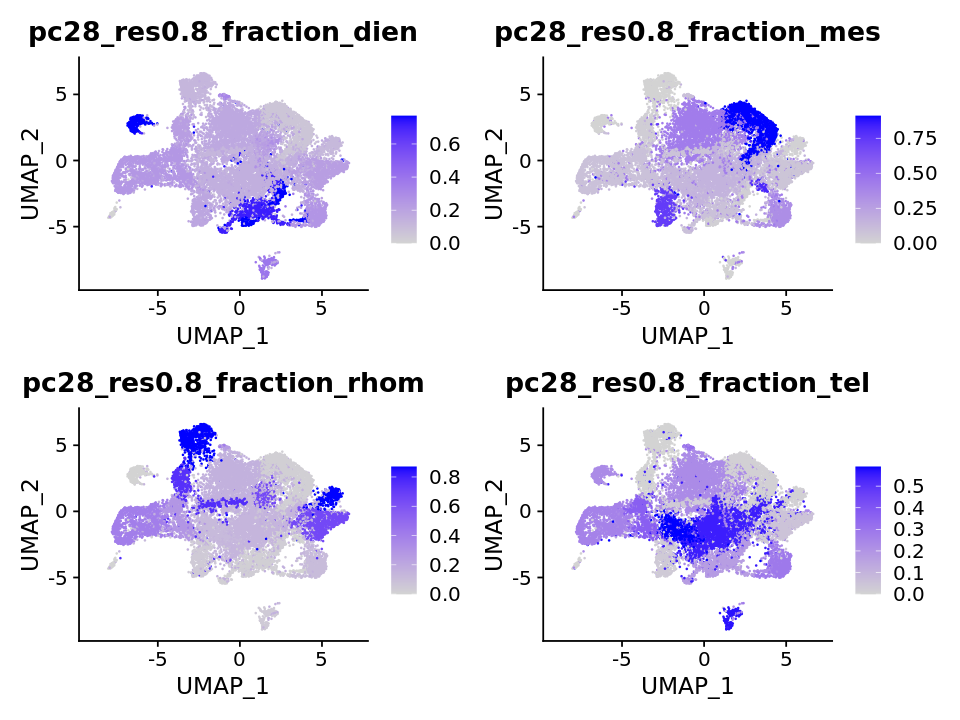

In [167]:
options(repr.plot.width=8, repr.plot.height=6)

FeaturePlot(rg_pool, features = c("pc28_res0.8_fraction_dien",
                                 "pc28_res0.8_fraction_mes",
                                 "pc28_res0.8_fraction_rhom",
                                 "pc28_res0.8_fraction_tel"), ncol = 2)

Code below is for a method I used previously to add metadata, now DOES NOT WORK (cells placed out of order).

In [103]:
# export data frame of cell barcodes with clusters to use as starting point for mappvalues transfer of metadata
rg_pool_cells <- data.frame("Barcode" = rg_pool@assays$RNA@counts@Dimnames[[2]],
                                "Cluster" = rg_pool$pc28_res0.8_clusters_numeric_edited)

In [104]:
dim(rg_pool_cells)
head(rg_pool_cells)

[1] 16387     2

,Barcode,Cluster
,<chr>,<fct>
B1.T_AAACATTGGAGCTT-1,B1.T_AAACATTGGAGCTT-1,2
B1.T_AAAGCAGAGCGATT-1,B1.T_AAAGCAGAGCGATT-1,1
B1.T_AAATACTGGTTGCA-1,B1.T_AAATACTGGTTGCA-1,3
B1.T_AACAATACTACTGG-1,B1.T_AACAATACTACTGG-1,1
B1.T_AACACGTGCATGCA-1,B1.T_AACACGTGCATGCA-1,1
B1.T_AACAGAGAGCTACA-1,B1.T_AACAGAGAGCTACA-1,1


In [117]:
rg_pool_cells_brain.reg <- merge(rg_pool_cells, brain.reg.by.cluster.df.wide)

In [118]:
dim(rg_pool_cells_brain.reg)
head(rg_pool_cells_brain.reg)

[1] 16387     9

,Cluster,Barcode,Fraction_dien,Fraction_mes,Fraction_rhom,Fraction_tel,Max_fraction,Max_region,Region_max_fraction
,<fct>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
1,1,B4.T_CGTCAGGAGATGGGTC-1,0.1509834,0.1557503,0.1408917,0.5523746,0.5523746,tel,tel_0.55
2,1,B12.M_GACACGCTCCCGACTT-1,0.1509834,0.1557503,0.1408917,0.5523746,0.5523746,tel,tel_0.55
3,1,B17.M_GACACGCTCGTAACAC-1,0.1509834,0.1557503,0.1408917,0.5523746,0.5523746,tel,tel_0.55
4,1,B3.T_GCTGCGAGTTCTGTTT-1,0.1509834,0.1557503,0.1408917,0.5523746,0.5523746,tel,tel_0.55
5,1,B2.T_GTAGGTACTTCCGC-1,0.1509834,0.1557503,0.1408917,0.5523746,0.5523746,tel,tel_0.55
6,1,B15.M_CCTACACCACCGCTAG-1,0.1509834,0.1557503,0.1408917,0.5523746,0.5523746,tel,tel_0.55


In [119]:
colnames(rg_pool_cells_brain.reg)

[1] "Cluster"             "Barcode"             "Fraction_dien"      
[4] "Fraction_mes"        "Fraction_rhom"       "Fraction_tel"       
[7] "Max_fraction"        "Max_region"          "Region_max_fraction"

In [120]:
#add columns from table to brain.regdata of seurat object
vector_fraction_dien <- rg_pool_cells_brain.reg$Fraction_dien
vector_fraction_mes <- rg_pool_cells_brain.reg$Fraction_mes
vector_fraction_rhom <- rg_pool_cells_brain.reg$Fraction_rhom
vector_fraction_tel <- rg_pool_cells_brain.reg$Fraction_tel
vector_max_fraction <- rg_pool_cells_brain.reg$Max_fraction
vector_max_region <- rg_pool_cells_brain.reg$Max_region
vector_region_max_fraction <- rg_pool_cells_brain.reg$Region_max_fraction

names(vector_fraction_dien) <- rg_pool_cells_brain.reg$Barcode
names(vector_fraction_mes) <- rg_pool_cells_brain.reg$Barcode
names(vector_fraction_rhom) <- rg_pool_cells_brain.reg$Barcode
names(vector_fraction_tel) <- rg_pool_cells_brain.reg$Barcode
names(vector_max_fraction) <- rg_pool_cells_brain.reg$Barcode
names(vector_max_region) <- rg_pool_cells_brain.reg$Barcode
names(vector_region_max_fraction) <- rg_pool_cells_brain.reg$Barcode

rg_pool$pc28_res0.8_fraction_dien <- vector_fraction_dien
rg_pool$pc28_res0.8_fraction_mes <- vector_fraction_mes
rg_pool$pc28_res0.8_fraction_rhom <- vector_fraction_rhom
rg_pool$pc28_res0.8_fraction_tel <- vector_fraction_tel
rg_pool$pc28_res0.8_max_fraction <- vector_max_fraction
rg_pool$pc28_res0.8_max_region <- vector_max_region
rg_pool$pc28_res0.8_region_max_fraction <- vector_region_max_fraction

In [121]:
head(vector_fraction_dien)

B4.T_CGTCAGGAGATGGGTC-1 B12.M_GACACGCTCCCGACTT-1 B17.M_GACACGCTCGTAACAC-1 
               0.1509834                0.1509834                0.1509834 
 B3.T_GCTGCGAGTTCTGTTT-1    B2.T_GTAGGTACTTCCGC-1 B15.M_CCTACACCACCGCTAG-1 
               0.1509834                0.1509834                0.1509834

In [130]:
head(rg_pool$pc28_res0.8_fraction_dien)

B1.T_AAACATTGGAGCTT-1 B1.T_AAAGCAGAGCGATT-1 B1.T_AAATACTGGTTGCA-1 
            0.1842852             0.1509834             0.2454876 
B1.T_AACAATACTACTGG-1 B1.T_AACACGTGCATGCA-1 B1.T_AACAGAGAGCTACA-1 
            0.1509834             0.1509834             0.1509834

In [122]:
str(rg_pool@meta.data)

'data.frame':	16387 obs. of  37 variables:
 $ orig.ident                          : chr  "b1_tel" "b1_tel" "b1_tel" "b1_tel" ...
 $ nCount_RNA                          : num  870 822 662 2128 1073 ...
 $ nFeature_RNA                        : int  428 356 308 804 414 1169 680 1659 251 1273 ...
 $ multiseq.relative.1.7               : chr  NA NA NA NA ...
 $ brain_reg                           : chr  "tel" "tel" "tel" "tel" ...
 $ kit_chem                            : chr  "3prim_v1" "3prim_v1" "3prim_v1" "3prim_v1" ...
 $ fixation                            : chr  "fresh" "fresh" "fresh" "fresh" ...
 $ percent.mt                          : num  2.11 0.491 18.2982 0.5429 0.0656 ...
 $ ident                               : chr  "b1_tel" "b1_tel" "b1_tel" "b1_tel" ...
 $ scDblFinder.class                   : chr  "singlet" "singlet" "singlet" "singlet" ...
 $ scDblFinder.score                   : num  0.0123 0.0873 0.1525 0.4752 0.2686 ...
 $ scDblFinder.weighted                : num  0.11

Versions below are even older code (manually adding the fractions):   

In [37]:
# restore "corrected" numeric cluster names
Idents(rg_pool) <- rg_pool$pc28_res0.8_clusters_numeric_edited

In [36]:
rg_pool <- RenameIdents(object = rg_pool, 
                         "1" = "0.55", 
                         "2" = "0.43",
                         "3" = "0.4", 
                         "4" = "0.65", 
                         "5" = "0.9", 
                         "6" = "0.87", 
                         "7" = "0.71", 
                         "8" = "0.36", 
                         "9" = "0.33", 
                         "10" = "0.58", 
                         "11" = "0.73", 
                         "12" = "0.75", 
                         "13" = "0.76", 
                         "14" = "0.87", 
                         "15" = "0.56", 
                         "16" = "0.76", 
                         "17" = "0.37", 
                         "18" = "0.82", 
                         "19" = "0.32", 
                        "20" = "0.77", #weird fixed artefact
                        "21" = "0" #5' batch effect
                        )

#stash
rg_pool[["pc28_res0.8_regional_score_num"]] <- Idents(object = rg_pool)

In second version add region name as well as the max score.  

In [37]:
# restore "corrected" numeric cluster names
Idents(rg_pool) <- rg_pool$pc28_res0.8_clusters_numeric_edited

In [38]:
table(rg_pool@active.ident)


   1    2    3    4    5    6    7    8    9   10   11   20   12   13   14   15 
2648 3180 1248 1155 1690  880  745  659  637  630  500  415  407  386  384  234 
  16   17   21   18   19 
 232  139   94   75   49 

In [39]:
rg_pool <- RenameIdents(object = rg_pool, 
                         "1" = "tel_0.55", 
                         "2" = "mes_0.43",
                         "3" = "rhom_0.4", 
                         "4" = "rhom_0.65", 
                         "5" = "mes_0.9", 
                         "6" = "rhom_0.87", 
                         "7" = "dien_0.71", 
                         "8" = "tel_0.36", 
                         "9" = "mes_0.33", 
                         "10" = "tel_0.58", 
                         "11" = "mes_0.73", 
                         "12" = "rhom_0.75", 
                         "13" = "dien_0.76", 
                         "14" = "rhom_0.87", 
                         "15" = "tel_0.56", 
                         "16" = "rhom_0.76", 
                         "17" = "mes_0.37", 
                         "18" = "mes_0.82", 
                         "19" = "multi_0.32", 
                        "20" = "dien_0.77", #weird fixed artefact
                        "21" = "Unknown" #5' batch effect
                        )

#stash
rg_pool[["pc28_res0.8_regional_score_name_num"]] <- Idents(object = rg_pool)

##### Discrete classes

Based on 70% cutoff, assign each cluster as regional or global. Add regional specificity as separate metadata column - region-specific and simplified version.  

In [27]:
# restore "corrected" numeric cluster names
Idents(rg_pool) <- rg_pool$pc28_res0.8_clusters_numeric_edited

In [28]:
table(rg_pool@active.ident)


   1    2    3    4    5    6    7    8    9   10   11   20   12   13   14   15 
2648 3180 1248 1155 1690  880  745  659  637  630  500  415  407  386  384  234 
  16   17   21   18   19 
 232  139   94   75   49 

In [29]:
rg_pool <- RenameIdents(object = rg_pool, 
                         "1" = "Multi", 
                         "2" = "Multi",
                         "3" = "Multi", 
                         "4" = "Multi", 
                         "5" = "Mes", 
                         "6" = "Rhom", 
                         "7" = "Dien", 
                         "8" = "Multi", 
                         "9" = "Multi", 
                         "10" = "Multi", 
                         "11" = "Mes", 
                         "12" = "Rhom", 
                         "13" = "Dien", 
                         "14" = "Rhom", 
                         "15" = "Multi", 
                         "16" = "Rhom", 
                         "17" = "Multi", 
                         "18" = "Mes", 
                         "19" = "Multi", 
                        "20" = "Dien", #weird fixed artefact
                        "21" = "Unknown" #5' batch effect
                        )

#stash
rg_pool[["pc28_res0.8_regional_detailed"]] <- Idents(object = rg_pool)

And also add a simpler version (just regional/global split).

In [31]:
# restore "corrected" numeric cluster names
Idents(rg_pool) <- rg_pool$pc28_res0.8_clusters_numeric_edited

In [32]:
table(rg_pool@active.ident)


   1    2    3    4    5    6    7    8    9   10   11   20   12   13   14   15 
2648 3180 1248 1155 1690  880  745  659  637  630  500  415  407  386  384  234 
  16   17   21   18   19 
 232  139   94   75   49 

In [33]:
rg_pool <- RenameIdents(object = rg_pool, 
                         "1" = "Global", 
                         "2" = "Global",
                         "3" = "Global", 
                         "4" = "Global", 
                         "5" = "Regional", 
                         "6" = "Regional", 
                         "7" = "Regional", 
                         "8" = "Global", 
                         "9" = "Global", 
                         "10" = "Global", 
                         "11" = "Regional", 
                         "12" = "Regional", 
                         "13" = "Regional", 
                         "14" = "Regional", 
                         "15" = "Global", 
                         "16" = "Regional", 
                         "17" = "Global", 
                         "18" = "Regional", 
                         "19" = "Global", 
                        "20" = "Regional", #weird fixed artefact
                        "21" = "Unknown" #5' batch effect
                        )

#stash
rg_pool[["pc28_res0.8_regional_simple"]] <- Idents(object = rg_pool)

And additionally, a layer of annotation where withing the global group the global proliferating and global non-proliferating are clearly separated. This is useful for annotating trajectories with scVelo to see clearer patterns.

In [41]:
# restore "corrected" numeric cluster names
Idents(rg_pool) <- rg_pool$pc28_res0.8_clusters_numeric_edited

In [42]:
table(rg_pool@active.ident)


   1    2    3    4    5    6    7    8    9   10   11   20   12   13   14   15 
2648 3180 1248 1155 1690  880  745  659  637  630  500  415  407  386  384  234 
  16   17   21   18   19 
 232  139   94   75   49 

In [43]:
rg_pool <- RenameIdents(object = rg_pool, 
                         "1" = "Global", 
                         "2" = "Global",
                         "3" = "Global prol.", 
                         "4" = "Global", 
                         "5" = "Regional", 
                         "6" = "Regional", 
                         "7" = "Regional", 
                         "8" = "Global prol.", 
                         "9" = "Global", 
                         "10" = "Global", 
                         "11" = "Regional", 
                         "12" = "Regional", 
                         "13" = "Regional", 
                         "14" = "Regional", 
                         "15" = "Global", 
                         "16" = "Regional", 
                         "17" = "Global", 
                         "18" = "Regional", 
                         "19" = "Global", 
                        "20" = "Regional", #weird fixed artefact
                        "21" = "Unknown" #5' batch effect
                        )

#stash
rg_pool[["pc28_res0.8_regional_simple_prol"]] <- Idents(object = rg_pool)

For Fig 2B, also additionally highlight the global Notch+ group.  

In [13]:
# restore "corrected" numeric cluster names
Idents(rg_pool) <- rg_pool$pc28_res0.8_clusters_numeric_edited

In [14]:
table(rg_pool@active.ident)


   1    2    3    4    5    6    7    8    9   10   11   20   12   13   14   15 
2648 3180 1248 1155 1690  880  745  659  637  630  500  415  407  386  384  234 
  16   17   21   18   19 
 232  139   94   75   49 

In [15]:
rg_pool <- RenameIdents(object = rg_pool, 
                         "1" = "Global", 
                         "2" = "Global",
                         "3" = "Global (prol.)", 
                         "4" = "Global", 
                         "5" = "Regional", 
                         "6" = "Regional", 
                         "7" = "Regional", 
                         "8" = "Global (prol.)", 
                         "9" = "Global", 
                         "10" = "Global (Notch)", 
                         "11" = "Regional", 
                         "12" = "Regional", 
                         "13" = "Regional", 
                         "14" = "Regional", 
                         "15" = "Global", 
                         "16" = "Regional", 
                         "17" = "Global", 
                         "18" = "Regional", 
                         "19" = "Global", 
                        "20" = "Regional", #weird fixed artefact
                        "21" = "Unknown" #5' batch effect
                        )

#stash
rg_pool[["pc28_res0.8_regional_simple_prol_notch"]] <- Idents(object = rg_pool)

### Eliminate doublet clusters and save objects

In [16]:
# for final plots remove doublet/artefact clusters
# cluster 23 is likely doublet with immune cells
# cluster 13 is composed of only fixed dien/tel cells and has no unique markers  in spite of being in a distinct UMAP position

# restore "corrected" numeric labels
Idents(rg_pool) <- rg_pool$pc28_res0.8_clusters_numeric_edited

In [17]:
# remove clusters that correspond to doublets & strong batch effects
rg_pool_sub <- subset(rg_pool, idents = c(19, 20, 21), invert = TRUE)
table(rg_pool_sub@active.ident)


   1    2    3    4    5    6    7    8    9   10   11   12   13   14   15   16 
2648 3180 1248 1155 1690  880  745  659  637  630  500  407  386  384  234  232 
  17   18 
 139   75 

In [18]:
# restore "corrected" numeric labels
#Idents(rg_pool_sub) <- rg_pool_sub$pc28_res0.8_clusters_numeric_edited

Complete dataset:

In [23]:
# read in
rg_pool <- readRDS(file = "/local/Nina/jupyterlab/brains_trans/rg_pool_reg.rds")

In [107]:
# save this embedding with updated clustering and metadata labels
saveRDS(rg_pool, file = "/local/Nina/jupyterlab/brains_trans/rg_pool_reg.rds")

Pruned dataset (removed suspected doublet clusters) - use this for final figures:

In [108]:
# save the embedding with problematic clusters excluded
saveRDS(rg_pool_sub, file = "/local/Nina/jupyterlab/brains_trans/rg_pool_reg_sub.rds")

In [2]:
# read in
rg_pool_sub <- readRDS(file = "/local/Nina/jupyterlab/brains_trans/rg_pool_reg_sub.rds")